In [13]:
%matplotlib inline


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import xbout
import scipy
import xhermes

onedrive_path = onedrive_path = str(os.getcwd()).split("OneDrive")[0] + "OneDrive"
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\sdtools"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\soledge"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages"))

from hermes3.utils import *

import gridtools.solps_python_scripts.setup
from gridtools.solps_python_scripts.utilities.last10s       import read_last10s

from hermes3.fluxes import *
from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *

from code_comparison.code_comparison import *
from code_comparison.solps_pp import *
from code_comparison.viewer_2d import *

import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

%load_ext autoreload
%autoreload 2

plt.close("all")
%matplotlib inline

print("Done")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done


In [14]:
db = CaseDB()

toload = [ 
    dict(name="1e19", id="d45a-d42acb_1e19", unnormalise_geom = True, use_xhermes = True, squash = True), 
    dict(name="2e19", id="d42acb-with_guards", unnormalise_geom = True, use_xhermes = True, squash = True), 
    dict(name="3e19", id="d44a-d42acb_3e19", unnormalise_geom = True, use_xhermes = True, squash = True), 

]
cs = {}
for case in toload:
    cs[case["name"]] = db.load_case_2D(case["id"], use_squash = case["squash"], verbose = True)


- Reading case d45a-d42acb_1e19
-----------------------
- Looking for squash file
- Squash file found. squash date 09/10/2024, 15:25:51, dmp file date 09/10/2024, 12:44:06


C:\Users\mikek\OneDrive\Project\python-packages\xBOUT\xbout\load.py:1138: UserWarning: Will drop all variables containing the dimensions 't' because they are not recognised
  warn(



Unnormalising with xHermes
- Reading case d42acb-with_guards
-----------------------
- Looking for squash file
- Squash file found. squash date 09/03/2024, 10:49:23, dmp file date 09/03/2024, 10:28:10


C:\Users\mikek\OneDrive\Project\python-packages\xBOUT\xbout\load.py:1138: UserWarning: Will drop all variables containing the dimensions 't' because they are not recognised
  warn(



Unnormalising with xHermes
- Reading case d44a-d42acb_3e19
-----------------------
- Looking for squash file
- Squash file found. squash date 09/10/2024, 15:27:45, dmp file date 09/10/2024, 12:48:53


C:\Users\mikek\OneDrive\Project\python-packages\xBOUT\xbout\load.py:1138: UserWarning: Will drop all variables containing the dimensions 't' because they are not recognised
  warn(



Unnormalising with xHermes


# Read SOLEDGE

In [15]:
soledgecases = {
    "tightwall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_1e19"), # Hermes-3 like wall
    "tightwall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_2e19"), # Hermes-3 like wall
    "widewall_2e19_5m" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19_5M"),
    "tightwall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_3e19"), # Hermes-3 like wall
    "widewall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_1e19"), 
    "widewall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19"), 
    "widewall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_3e19"), 
}

sl = dict()

for name in soledgecases:
    path = soledgecases[name]
    sl[name] = SOLEDGEdata(path = path)
    sl[name].read_csv(os.path.join(path, "omp_plasma.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "omp_neutrals.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "imp_plasma.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "imp_neutrals.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "wall_ntmpi_plasma.csv"), mode = "wall_ntmpi")



# Read SOLPS

In [26]:
solpscases = {

    "tightwall_noD2_1e19_novisc" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=1.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_2e19_novisc" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_3e19_novisc" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_1e19_novisc_spectra" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc_spectra\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=1.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_2e19_novisc_spectra" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc_spectra\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_3e19_novisc_spectra" : r"C:\Users\mikek\OneDrive\Project\collab\From\Matteo\2024-11-01 - 1e19 2e19 3e19 no viscosity, spectra\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_spectra_20241106\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_1e19_fixpuff" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playArounD_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc_fixpuff\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=1.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_2e19_fixpuff" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playArounD_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc_fixpuff\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_3e19_fixpuff" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playArounD_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc_fixpuff\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0",
    "tightwall_noD2_1e19_zerophi" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_zero_phi\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=1.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0.b2news_poteq=0",
    "tightwall_noD2_2e19_zerophi" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_zero_phi\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0.b2news_poteq=0",
    "tightwall_noD2_3e19_zerophi" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_zero_phi\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0.b2news_poteq=0",
    
    # "base" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5"),
    # "noiz_core" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16"),
    # "gammai_2.5" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.GAMMAI=2.5E+00"),
    # "dpuff_1e22" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=1.0E+22"),
    # "dpuff_5e21" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=5.0E+21"),
    # "no_fast_reflec" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.Pf=0"),
    # "nsep_2e19" : os.path.join(onedrive_path,r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=2E+19"),
    # "nsep_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=3E+19"),
    # "narrow_core" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.core_extent"),
    # "no_visc" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.core_extent.b2tqca_phm0=0"),
    
    # "core_extent_16x_mc" : os.path.join(onedrive_path, r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.xxx.BCCON=16.core_extent.MC.histories.x16-ish.NOT.converged"),
    # "widewall_2e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=2E+19",
    "tightwall_2e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_MK\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19",
    "tightwall_3e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_MK\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19",
    "tightwall_noD2_1e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_MK\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.NESEPM=1.0E+19.NO.D2",
    "tightwall_noD2_2e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_MK\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19.NO.D2",
    "tightwall_noD2_3e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_MK\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19.NO.D2",
    
}

sp = dict()

for name in solpscases:
    sp[name] = SOLPSdata()
    # _ = read_last10s(solpscases[name], save = True)
    # sp[name].read_last10s(solpscases[name])
    sp[name].read_from_case(solpscases[name])

# Read Hermes-3

In [17]:
cs.keys()

dict_keys(['1e19', '2e19', '3e19'])

In [18]:
hr = dict()
for name in cs.keys(): 
    print(name)
    hr[name] = Hermesdata()
    ds = cs[name].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    hr[name].read_case(ds)

    
    ds = cs[name].ds
    ds = calculate_radial_fluxes(ds, new_afn = True)
    # ds = calculate_target_fluxes(ds)
    ds = reverse_pfr_fluxes(ds)

1e19
None 0.001
None 0.001
None 0.003
None 0.015
None 0.03
2e19
None 0.001
None 0.001
None 0.003
None 0.015
None 0.03
3e19
None 0.001
None 0.001
None 0.003
None 0.015
None 0.03


# Convergence

In [7]:
case = "no_fastrec_tune"
lineplot(
    {
        # "start":cs[case].ds.isel(t=0, x = slice(2,-2)),
        # "-5":cs[case].ds.isel(t=-3, x = slice(2,-2)),
        "last":cs[case].ds.isel(t=-1, x = slice(2,-2)),
        # "base":cs["base"].ds.isel(t=-1, x = slice(2,-2)),

    },
    clean_guards = False,
    params = ["Te", "Td+", "Td", "Ne", "Nd"],
    regions = ["omp", "outer_lower", "field_line"],
)

KeyError: 'no_fastrec_tune'

In [ ]:
cases = { 

    "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc_spectra"], color="deeppink"),
    "SOLEDGE2D" : dict(data=sl["tightwall_1e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['1e19'], color = "teal"),


    },

# New rebaseline - no viscosity

## 1e19

In [15]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_1e19_spectrum', 'tightwall_2e19_spectrum', 'tightwall_3e19_spectrum', 'tightwall_noD2_1e19_spectrum', 'tightwall_noD2_2e19_spectrum', 'tightwall_noD2_3e19_spectrum', 'tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


None not available in SOLEDGE2D, omp
None not available in SOLEDGE2D, imp
None not available in SOLEDGE2D, outer_lower
None not available in SOLEDGE2D, inner_lower


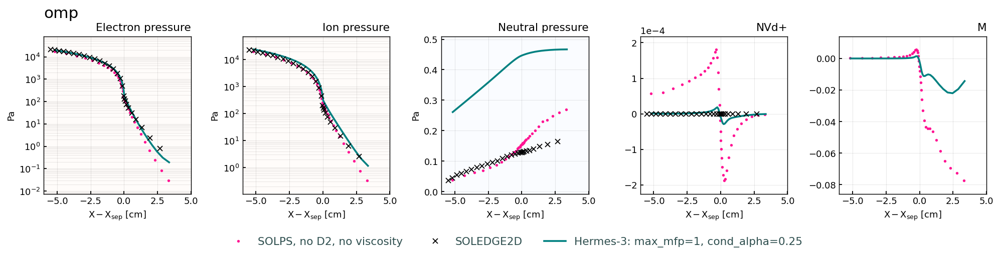

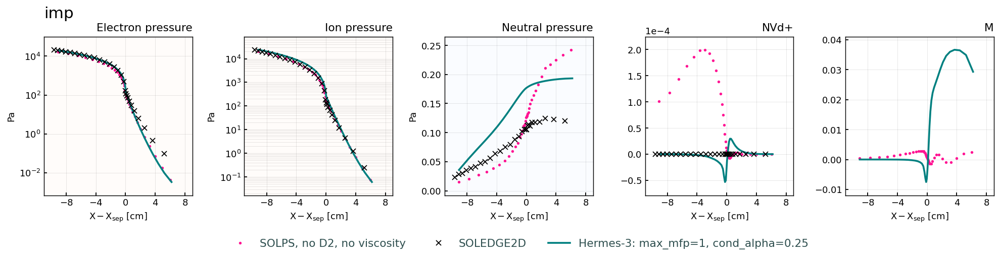

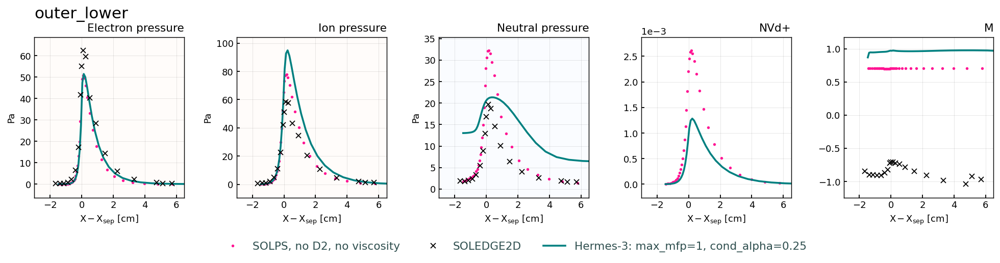

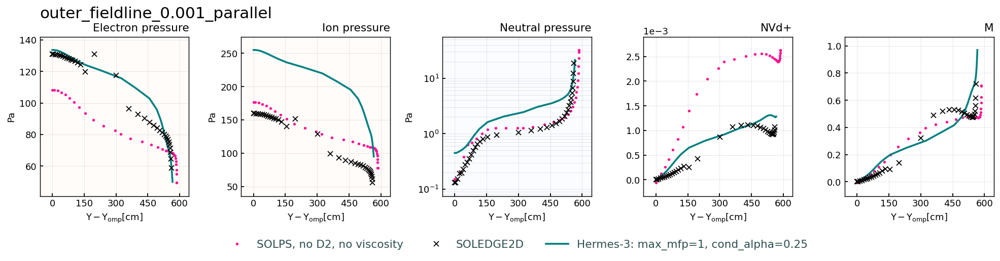

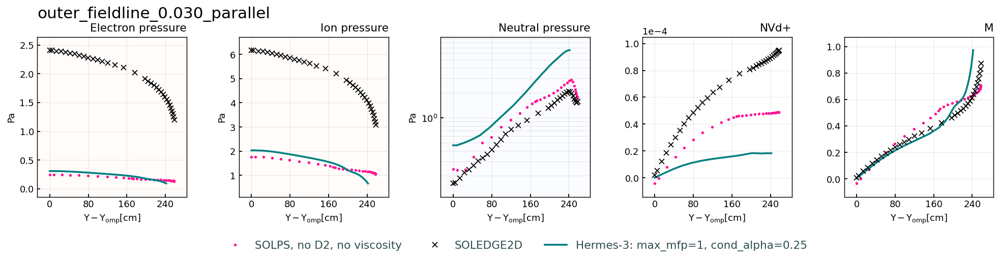

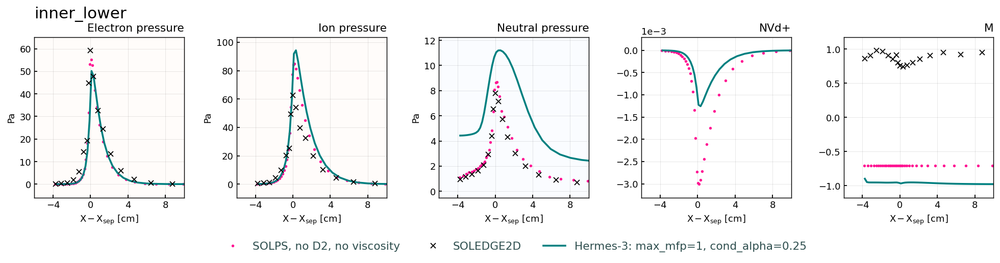

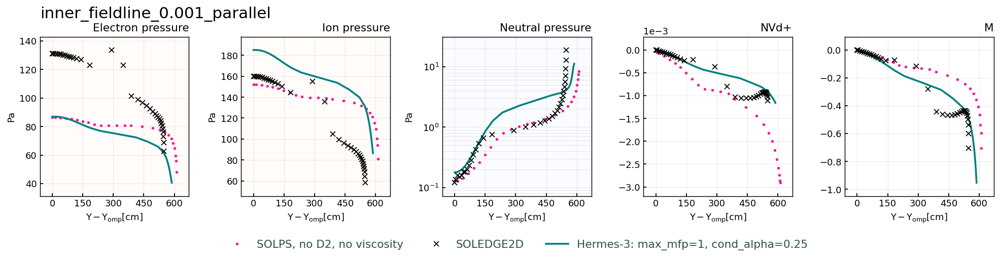

In [23]:
lineplot_compare(
    cases = { 

    "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc_spectra"], color="deeppink"),
    "SOLEDGE2D" : dict(data=sl["tightwall_1e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['1e19'], color = "teal"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Ne", "Te", "Pe", "Na", "Ta", "Pa"],
    params = ["Pe", "Pd+", "Pa", "NVd+", "M"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 2e19

In [7]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_1e19_spectrum', 'tightwall_2e19_spectrum', 'tightwall_3e19_spectrum', 'tightwall_noD2_1e19_spectrum', 'tightwall_noD2_2e19_spectrum', 'tightwall_noD2_3e19_spectrum', 'tightwall_noD2_2e19_novisc'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


None not available in SOLEDGE2D, omp
None not available in SOLEDGE2D, imp
None not available in SOLEDGE2D, outer_lower
None not available in SOLEDGE2D, inner_lower


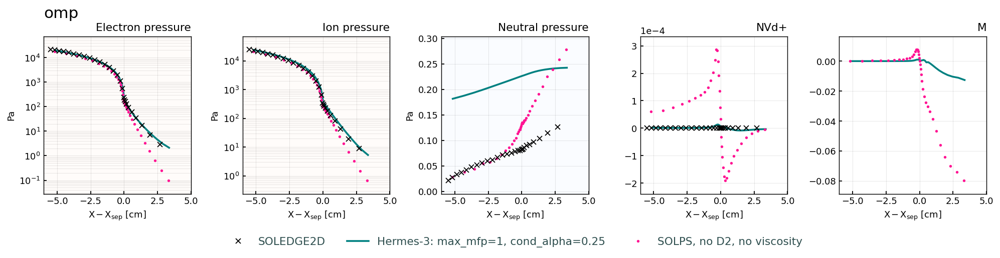

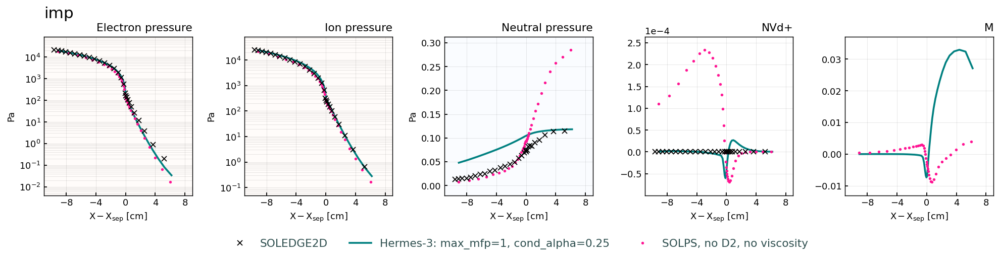

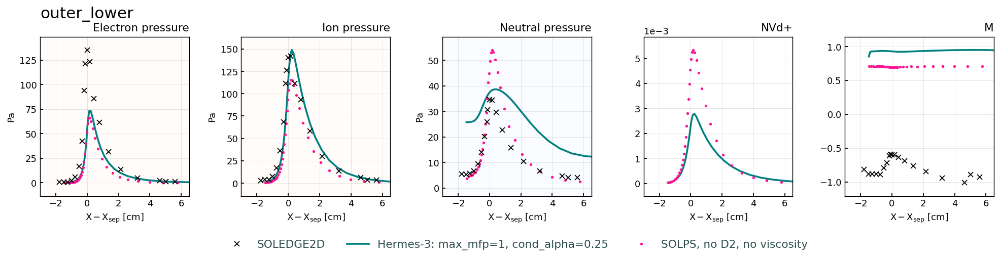

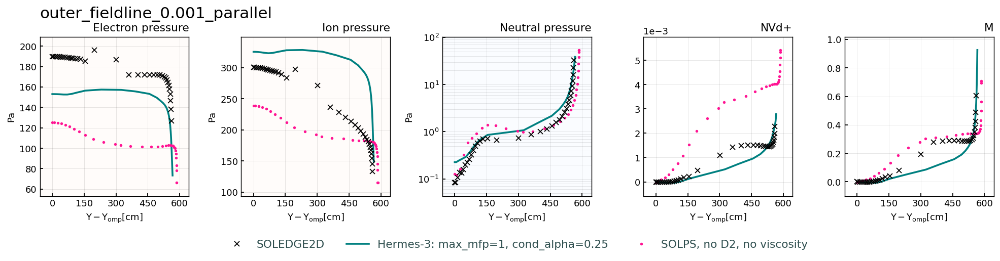

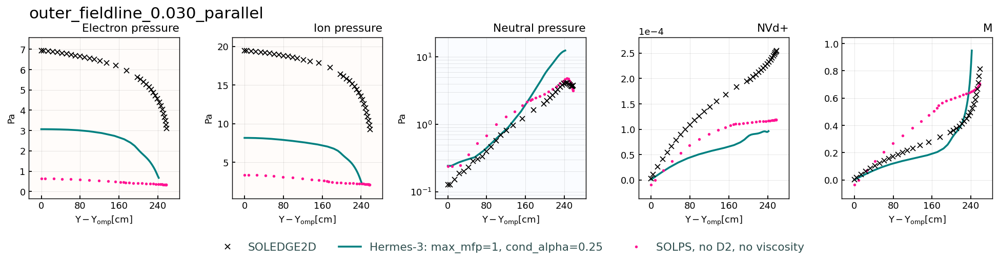

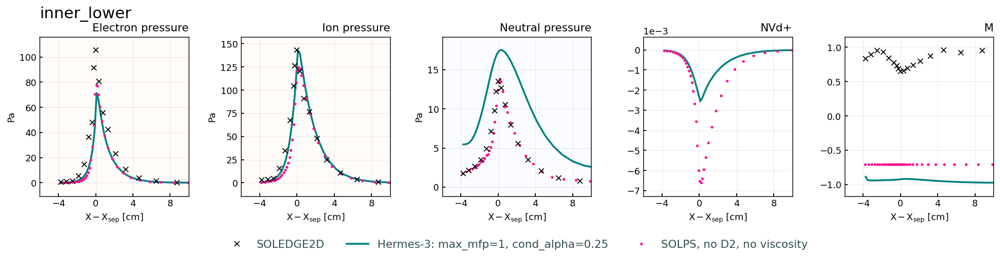

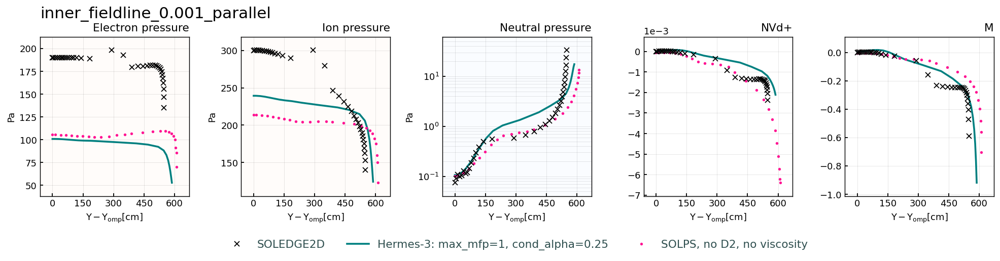

In [24]:
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['2e19'], color = "teal"),
    "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_2e19_novisc_spectra"], color="deeppink"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Ne", "Te", "Pe", "Na", "Ta", "Pa"],
    params = ["Pe", "Pd+", "Pa", "NVd+", "M"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 3e19

In [28]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_3e19_fixpuff_spectra'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


None not available in SOLEDGE2D, omp
None not available in SOLEDGE2D, imp
None not available in SOLEDGE2D, outer_lower
None not available in SOLEDGE2D, inner_lower


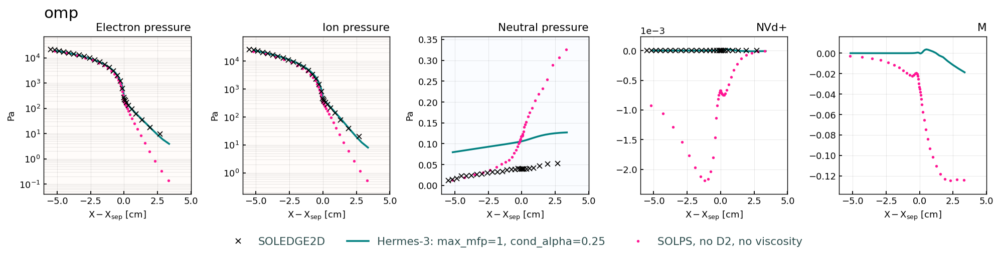

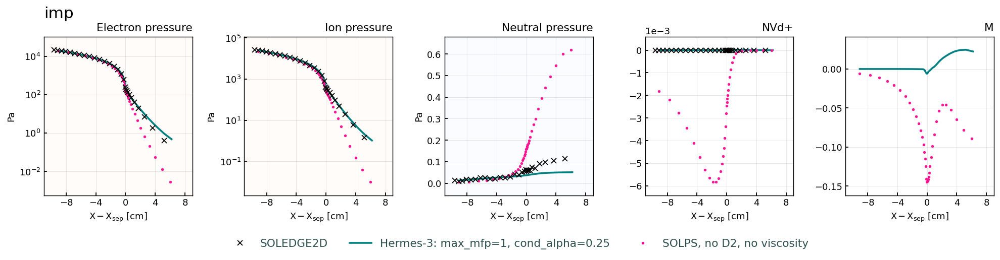

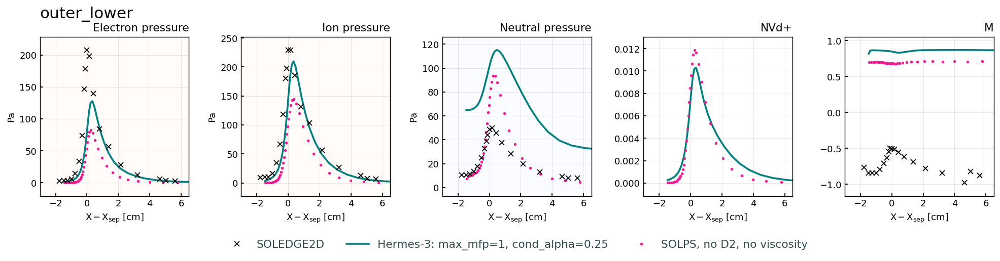

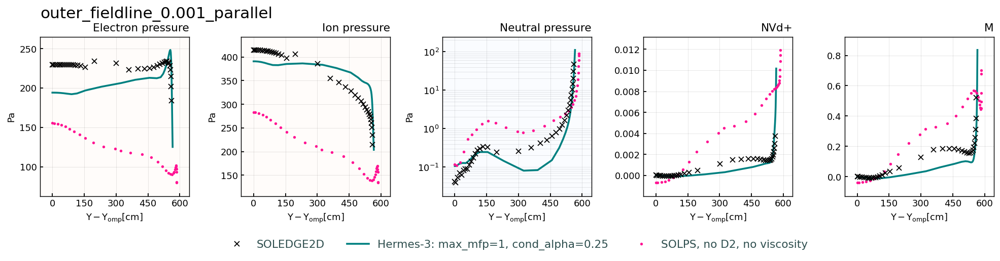

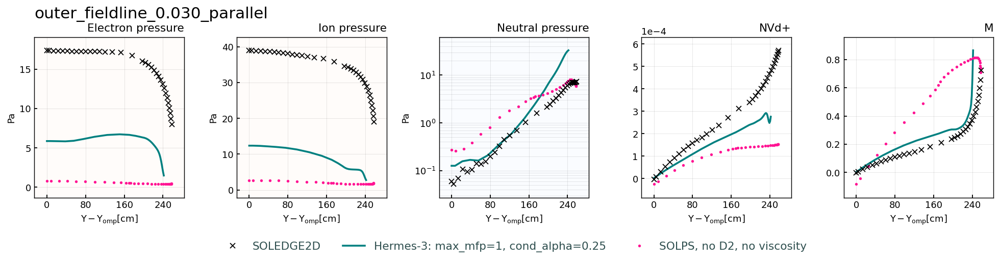

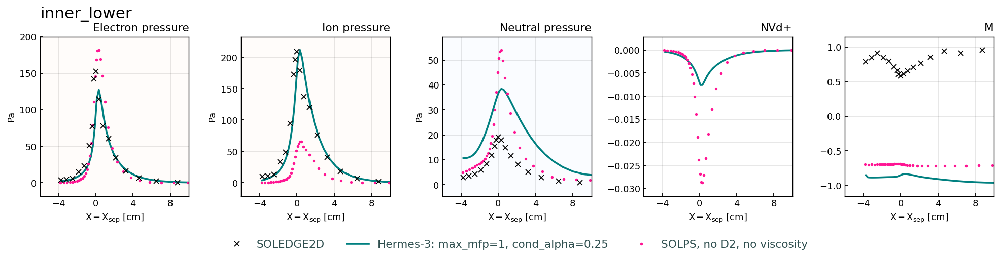

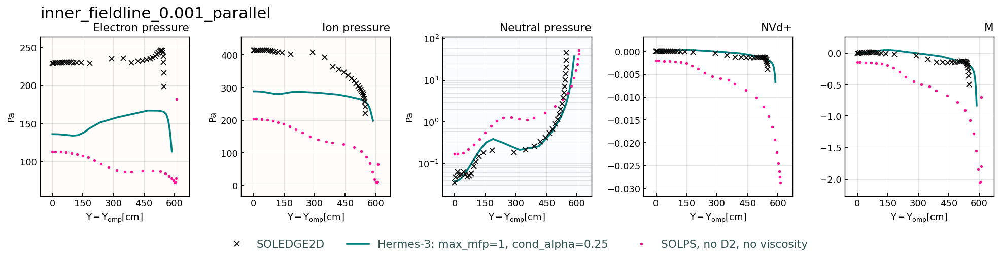

In [25]:
lineplot_compare(
    cases = { 
    # "SOLPS" : dict(data=sp["tightwall_2e19"], color="black"),
    # "SOLPS" : dict(data=sp["tightwall_3e19"], color="black"),
    # "SOLPS, no D2" : dict(data=sp["tightwall_noD2_3e19"], color="red"),
    "SOLEDGE2D" : dict(data=sl["tightwall_3e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['3e19'], color = "teal"),

    # "SOLPS, no D2" : dict(data=sp["tightwall_noD2_3e19_spectrum"], color="black"),
    "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_3e19_novisc_spectra"], color="deeppink"),
    # "SOLPS, no D2, no viscosity, fix puff" : dict(data=sp["tightwall_noD2_3e19_fixpuff_spectra"], color="blue"),

    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    # regions = ["outer_fieldline_parallel"],  
    # params = ["Ne", "Te", "Td+", "Na",  "Ta"],
    # params = ["Ne", "Te", "Pe", "Na", "Ta", "Pa"],
    params = ["Pe", "Pd+", "Pa", "NVd+", "M"],
    # params = ["Ne", "Sd+_iz"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

# Impact of puff

## 1e19

In [28]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc', 'tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_1e19_fixpuff', 'tightwall_noD2_2e19_fixpuff', 'tightwall_noD2_3e19_fixpuff'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


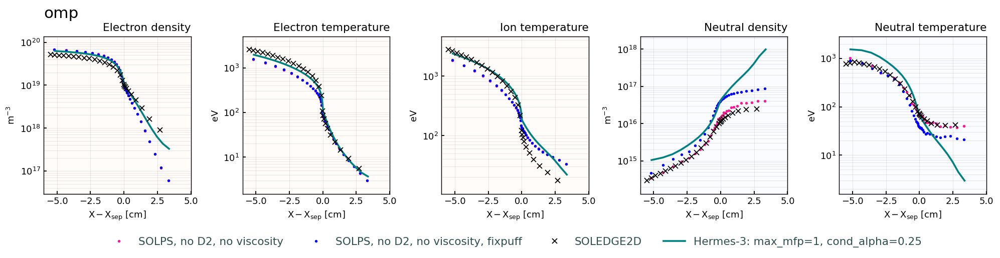

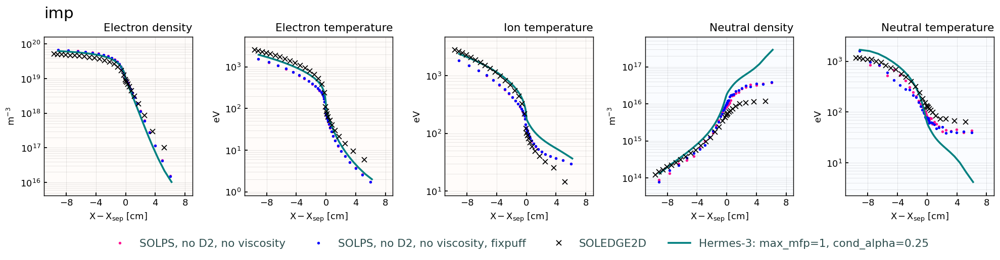

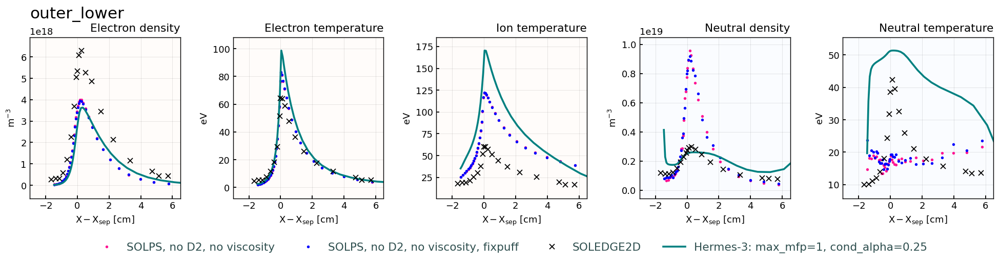

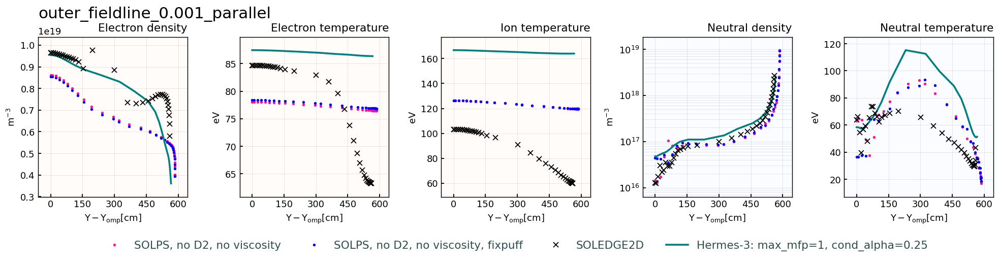

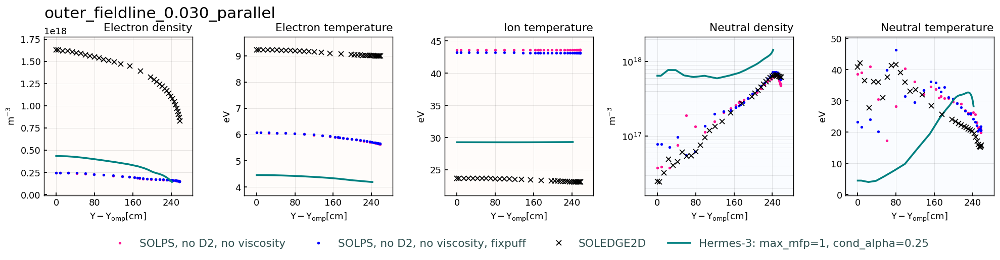

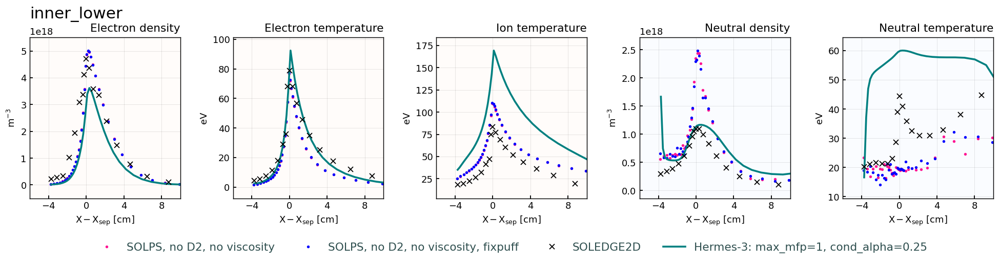

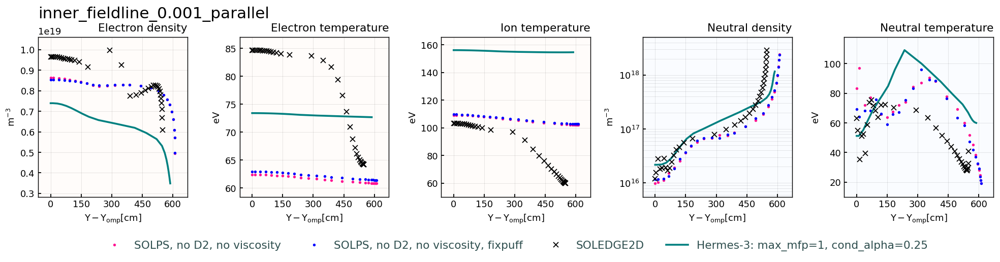

In [29]:
lineplot_compare(
    cases = { 

    "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff" : dict(data=sp["tightwall_noD2_1e19_fixpuff"], color="blue"),
    "SOLEDGE2D" : dict(data=sl["tightwall_1e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['1e19'], color = "teal"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 2e19

In [ ]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_1e19_spectrum', 'tightwall_2e19_spectrum', 'tightwall_3e19_spectrum', 'tightwall_noD2_1e19_spectrum', 'tightwall_noD2_2e19_spectrum', 'tightwall_noD2_3e19_spectrum', 'tightwall_noD2_2e19_novisc'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


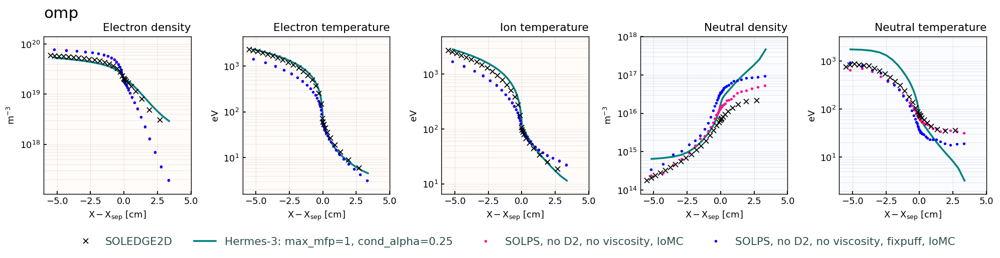

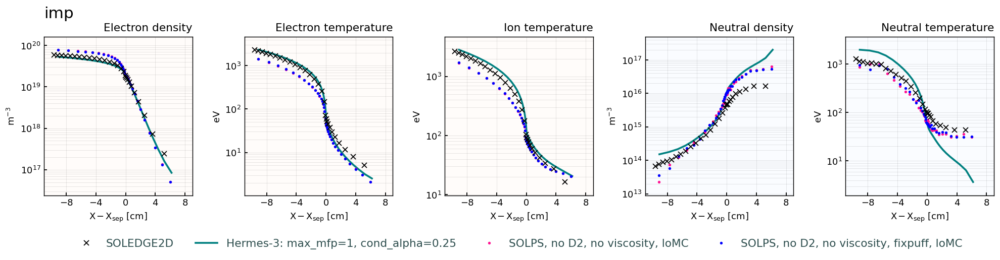

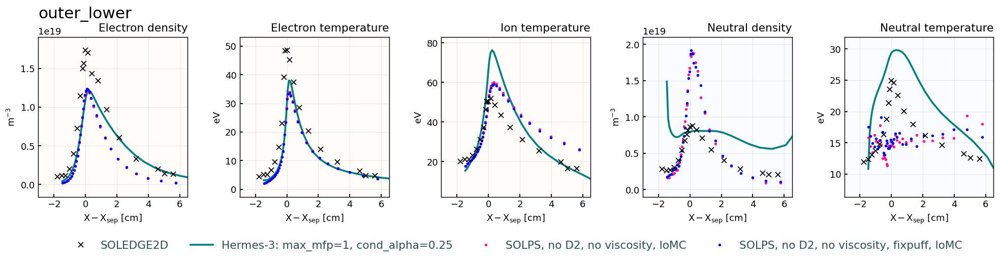

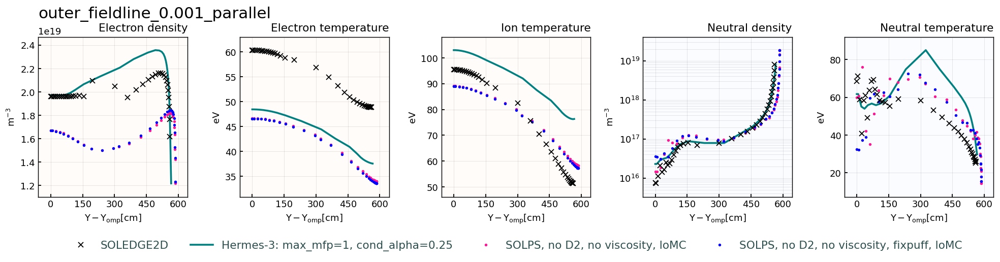

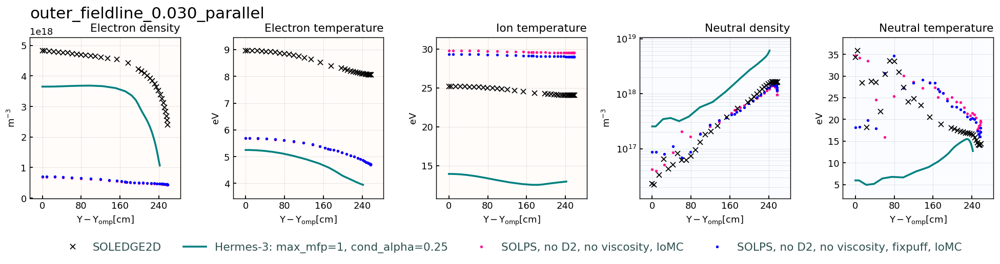

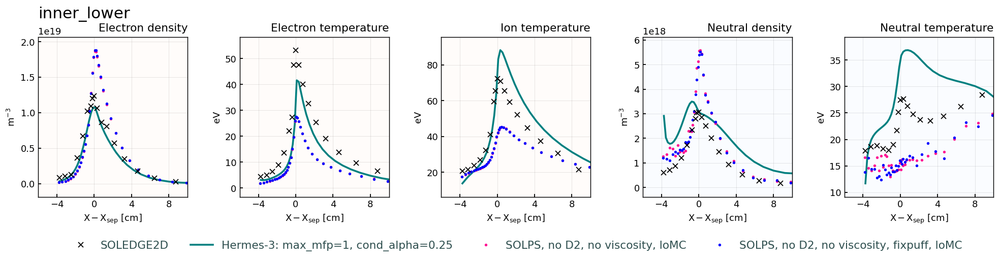

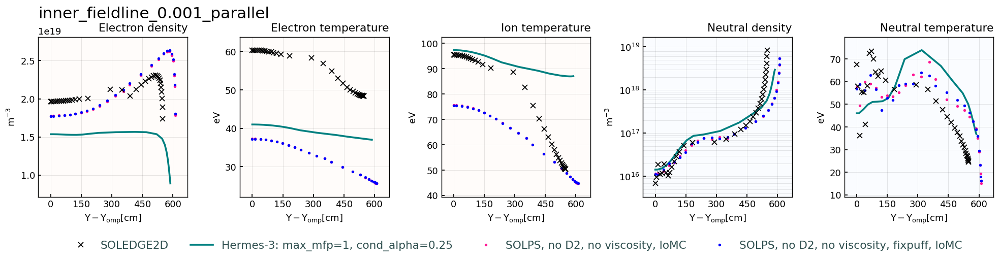

In [33]:
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['2e19'], color = "teal"),

    "SOLPS, no D2, no viscosity, loMC" : dict(data=sp["tightwall_noD2_2e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff, loMC" : dict(data=sp["tightwall_noD2_2e19_fixpuff"], color="blue"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 3e19

In [ ]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_3e19_fixpuff_spectra'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


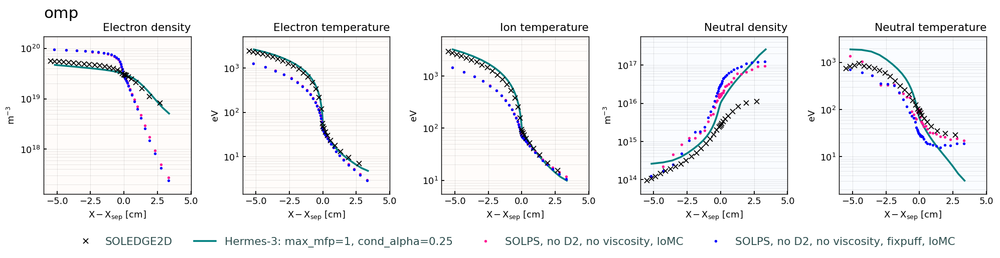

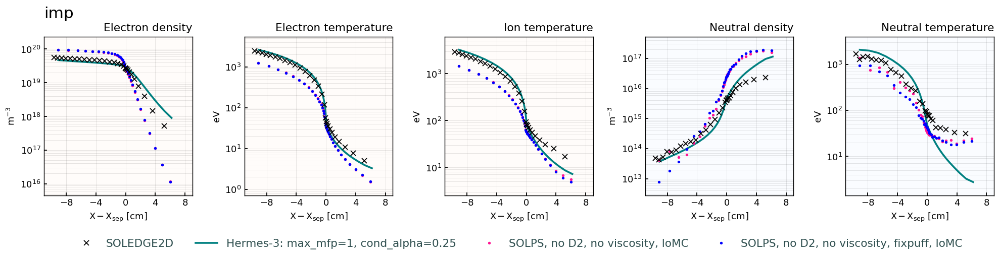

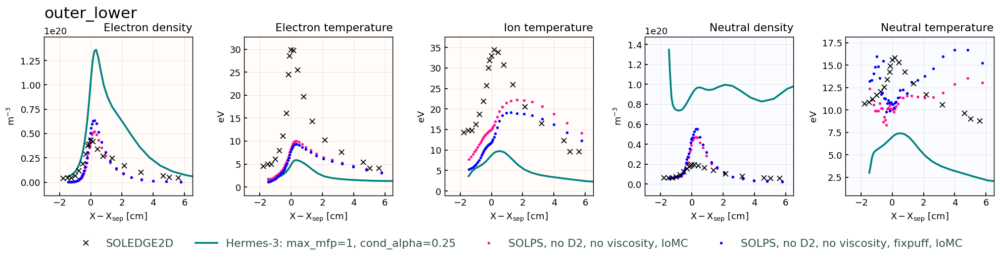

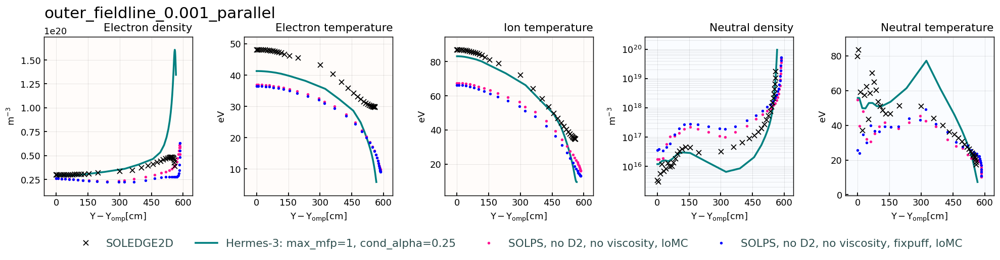

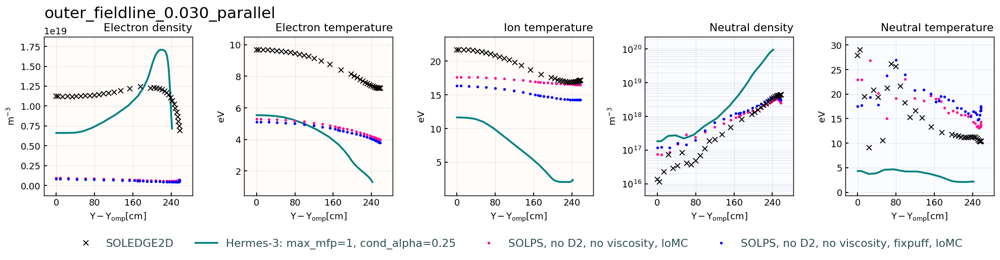

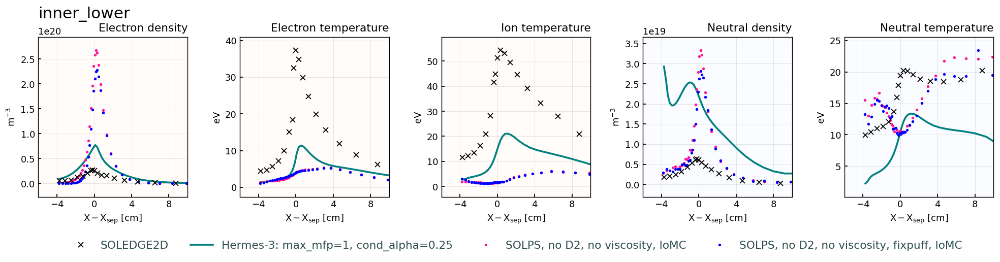

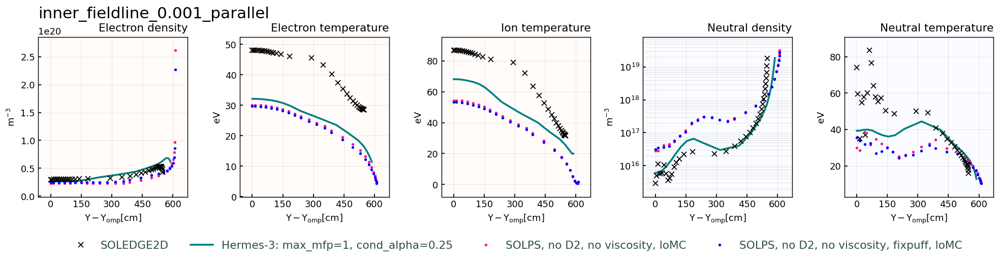

In [34]:
lineplot_compare(
    cases = { 
    "SOLEDGE2D" : dict(data=sl["tightwall_3e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['3e19'], color = "teal"),

    "SOLPS, no D2, no viscosity, loMC" : dict(data=sp["tightwall_noD2_3e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff, loMC" : dict(data=sp["tightwall_noD2_3e19_fixpuff"], color="blue"),

    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    # regions = ["outer_fieldline_parallel"],  
    params = ["Ne", "Te", "Td+", "Na",  "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Sd+_iz"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

# Impact of zero phi
- We found that the BC had a non zero potential

## 1e19

In [7]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc', 'tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_1e19_fixpuff', 'tightwall_noD2_2e19_fixpuff', 'tightwall_noD2_3e19_fixpuff', 'tightwall_noD2_1e19_zerophi', 'tightwall_2e19', 'tightwall_3e19', 'tightwall_noD2_1e19', 'tightwall_noD2_2e19', 'tightwall_noD2_3e19'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


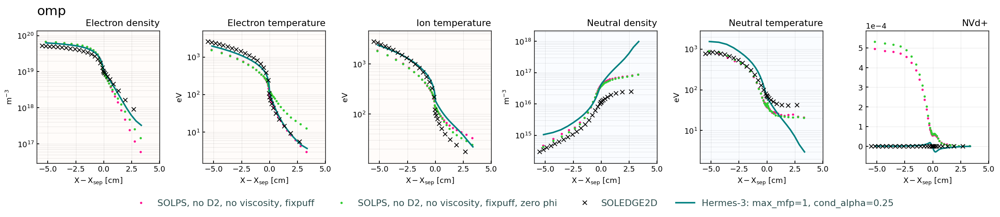

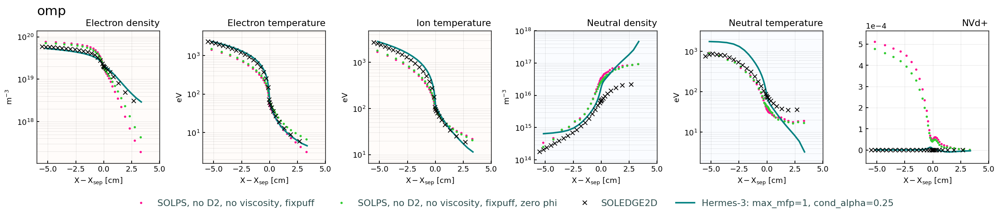

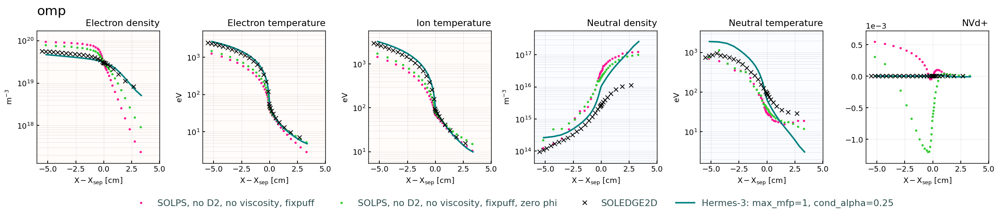

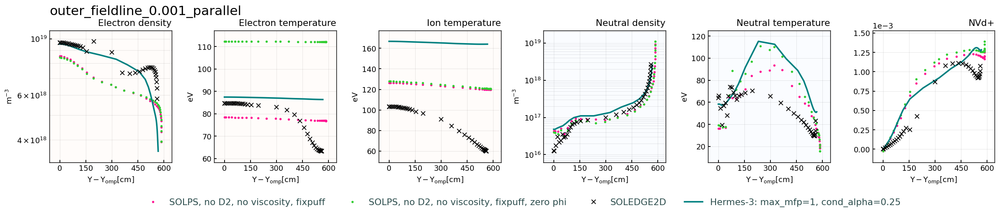

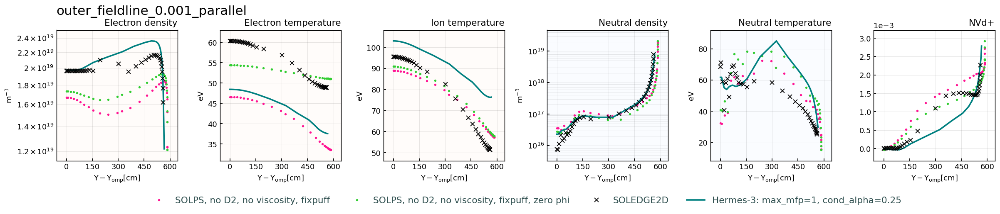

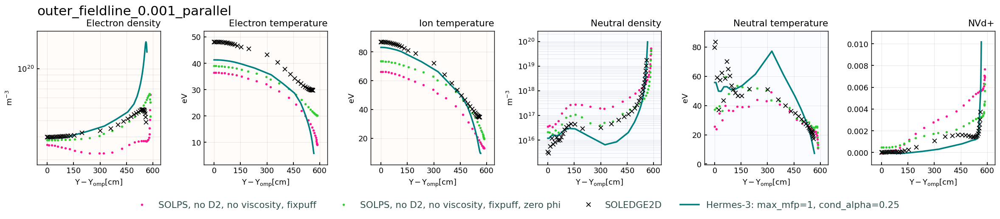

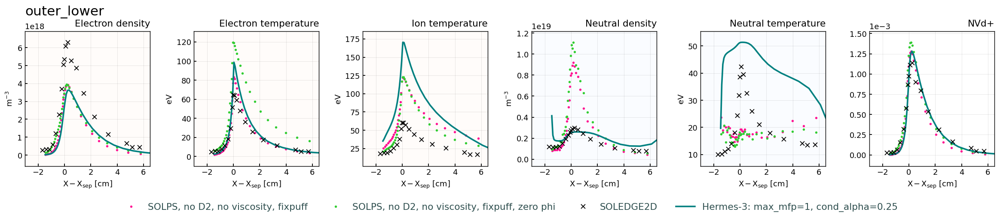

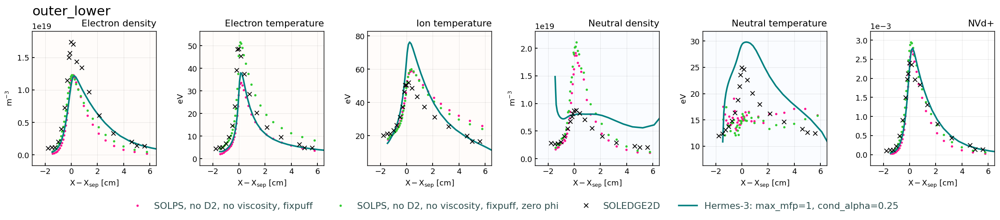

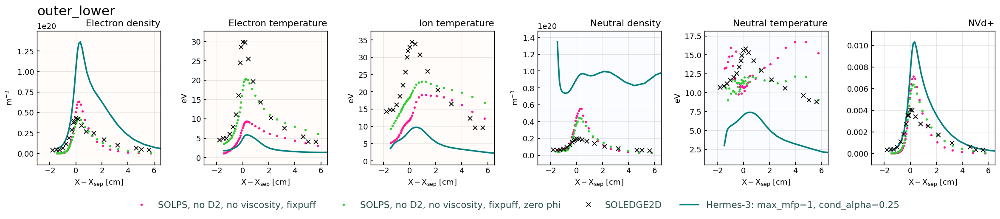

In [34]:
def cases(dens):
    
    return {
    "SOLPS, no D2, no viscosity, fixpuff" : dict(data=sp[f"tightwall_noD2_{dens}_fixpuff"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff, zero phi" : dict(data=sp[f"tightwall_noD2_{dens}_zerophi"], color="limegreen"),
    "SOLEDGE2D" : dict(data=sl[f"tightwall_{dens}"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr[f'{dens}'], color = "teal"),
}

params = ["Ne", "Te", "Td+", "Na", "Ta", "NVd+"]
for region in ["omp", "outer_fieldline_0.001_parallel", "outer_lower"]:
# for region in ["outer_lower"]:
    for dens in ["1e19", "2e19", "3e19"]:
        
        lineplot_compare(
            cases = cases(dens),
            regions = [region], 
            params = params,
            mode = "log",
            dpi = 100,
            lw = 2, 
            legend_nrows = 1,
            combine_molecules = False
        )

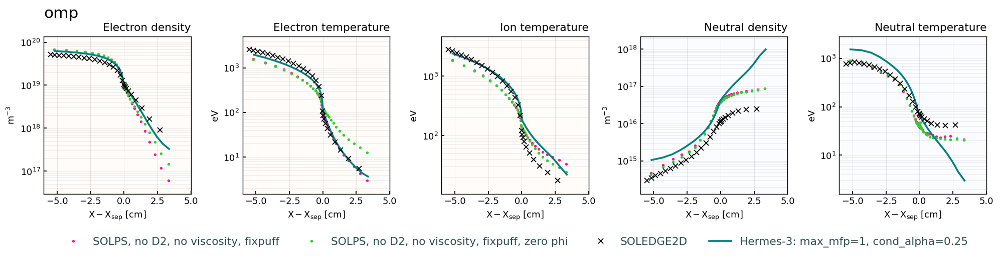

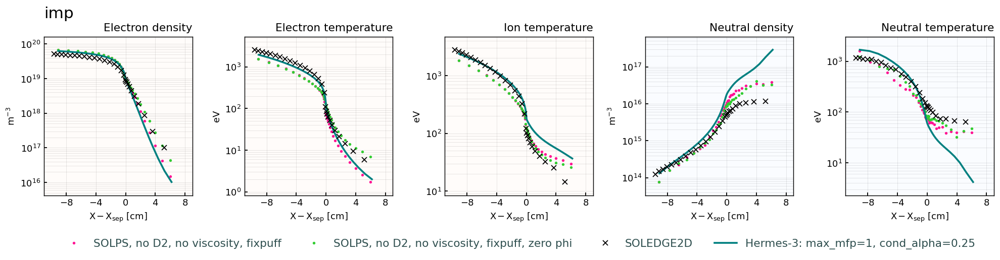

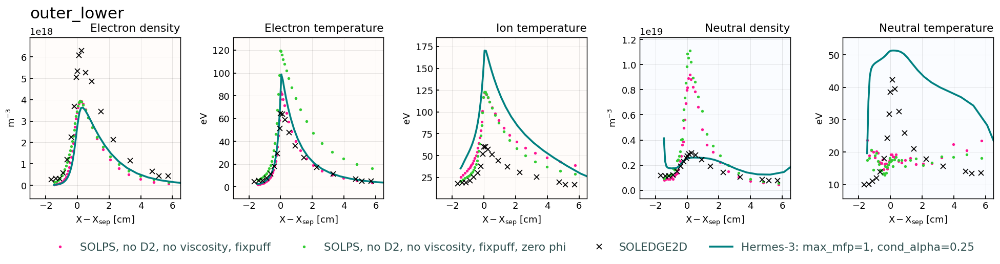

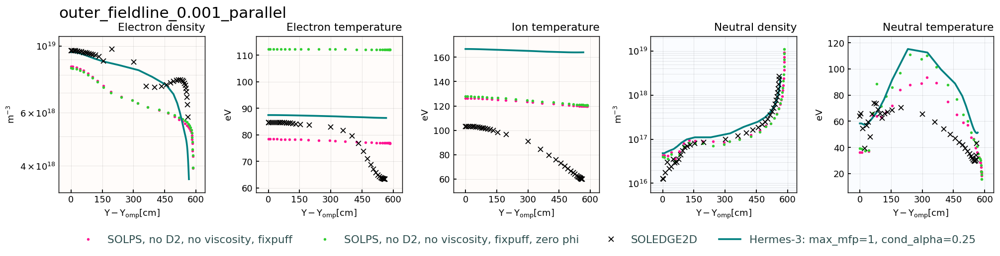

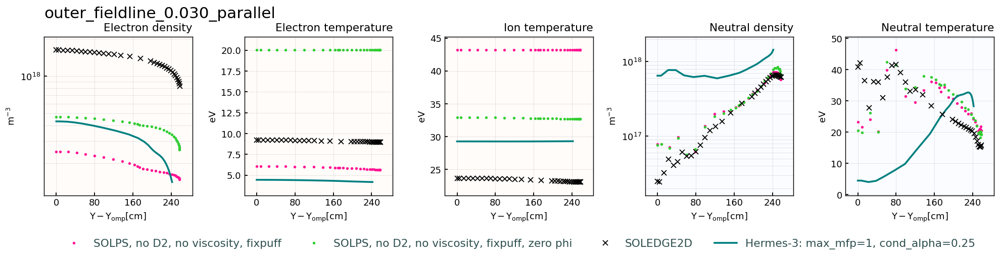

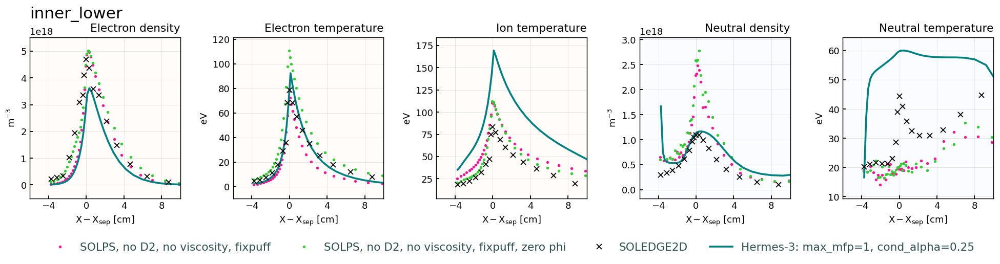

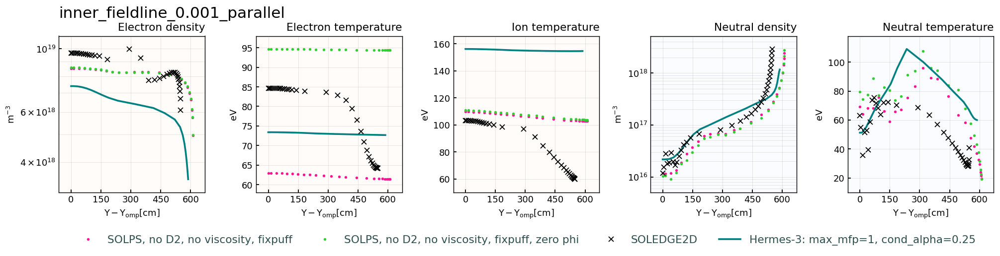

In [19]:
lineplot_compare(
    cases = { 

    # "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff" : dict(data=sp["tightwall_noD2_1e19_fixpuff"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff, zero phi" : dict(data=sp["tightwall_noD2_1e19_zerophi"], color="limegreen"),
    "SOLEDGE2D" : dict(data=sl["tightwall_1e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['1e19'], color = "teal"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 2e19

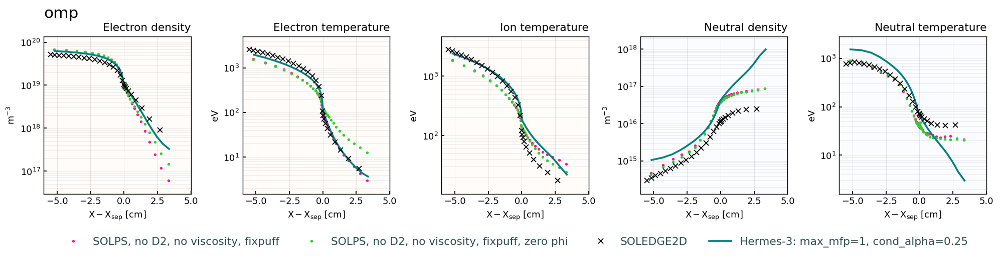

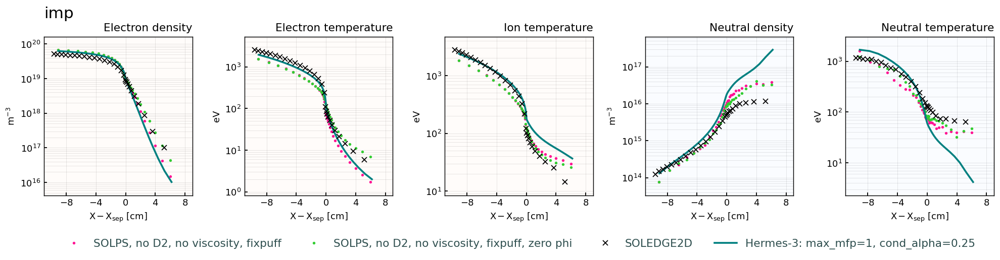

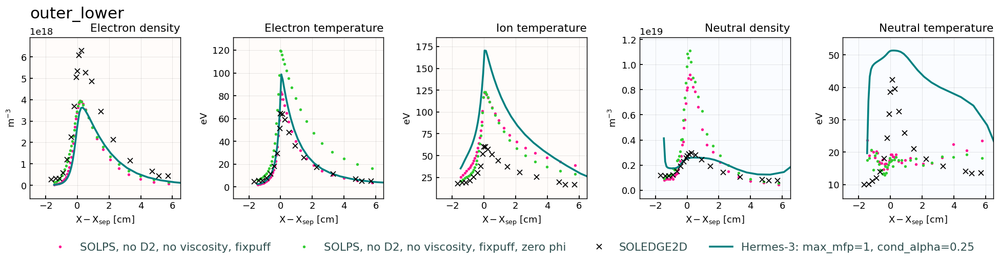

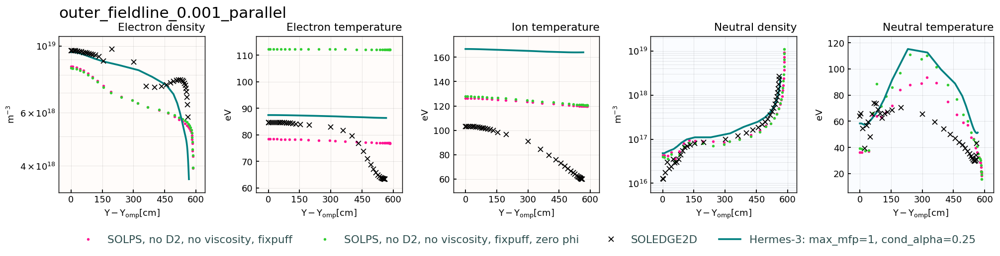

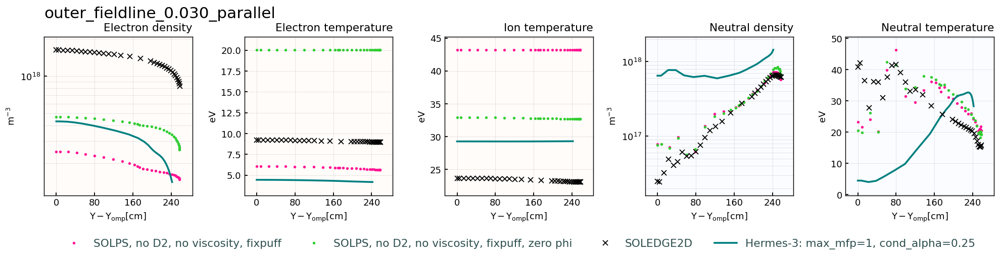

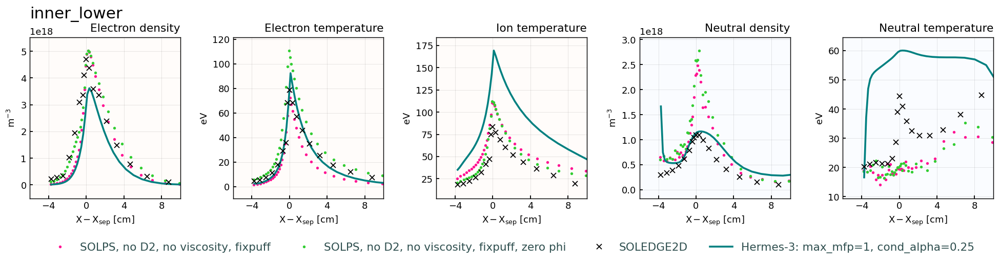

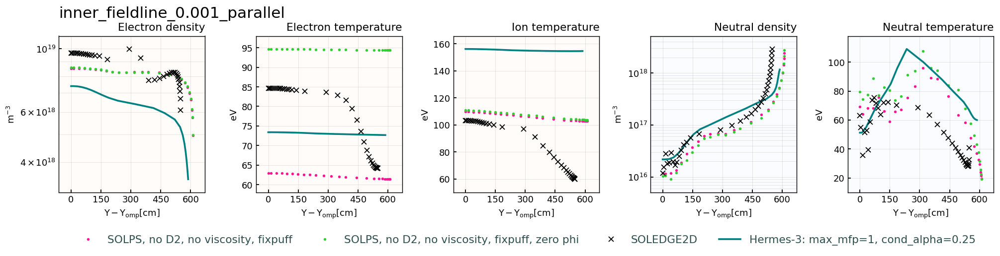

In [ ]:
lineplot_compare(
    cases = { 

    # "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff" : dict(data=sp["tightwall_noD2_2e19_fixpuff"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff, zero phi" : dict(data=sp["tightwall_noD2_2e19_zerophi"], color="limegreen"),
    "SOLEDGE2D" : dict(data=sl["tightwall_1e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['1e19'], color = "teal"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 3e19

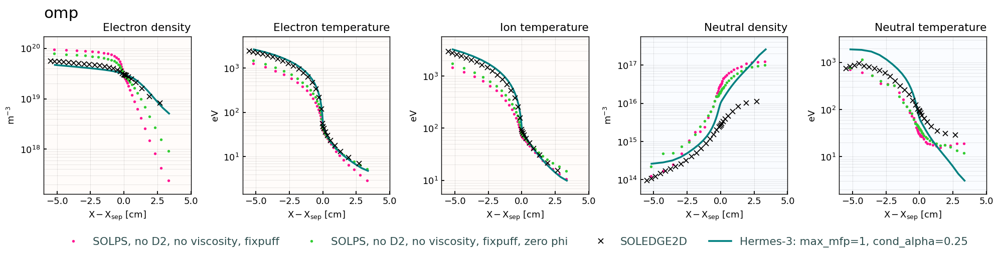

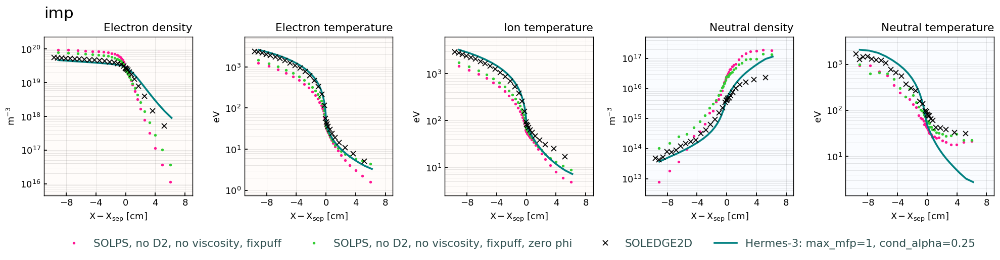

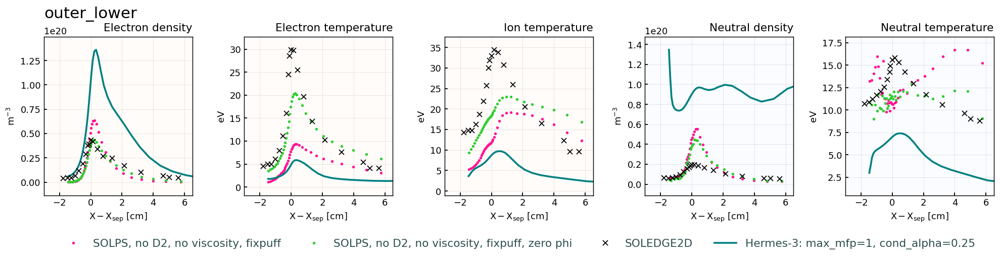

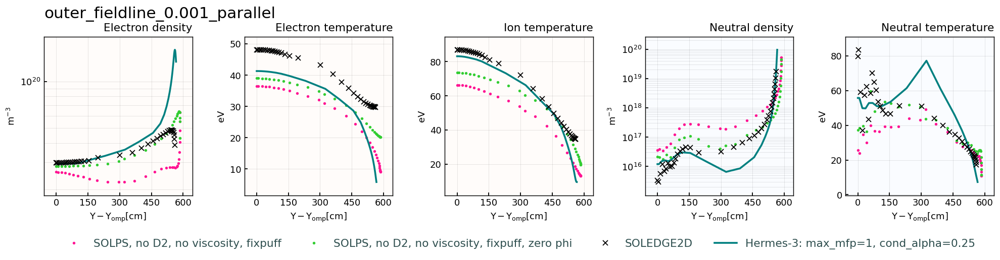

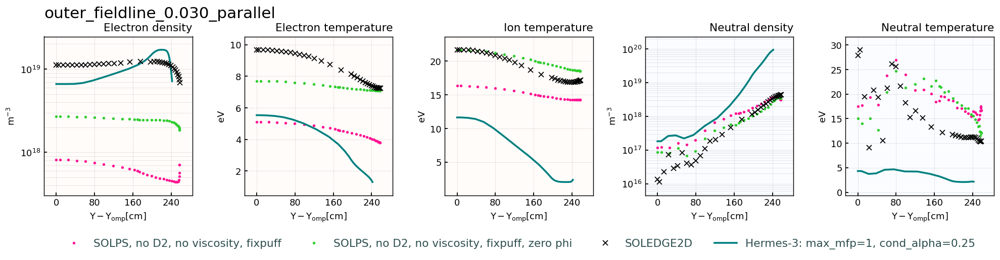

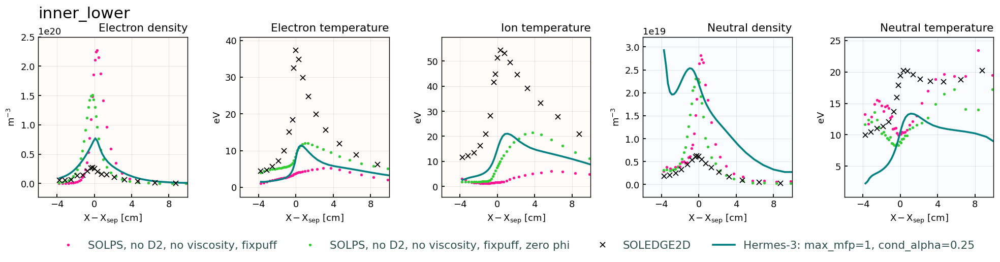

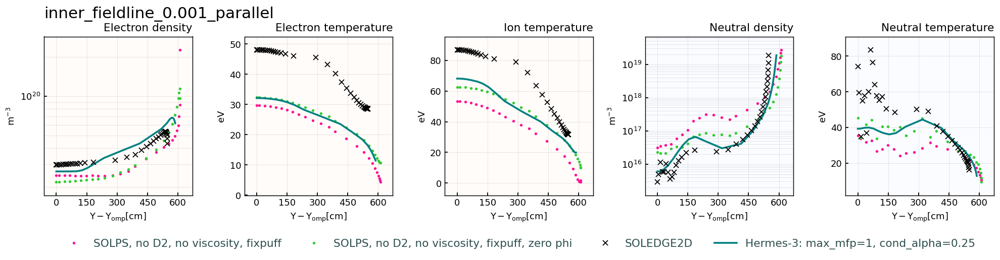

In [27]:
lineplot_compare(
    cases = { 

    # "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff" : dict(data=sp["tightwall_noD2_3e19_fixpuff"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff, zero phi" : dict(data=sp["tightwall_noD2_3e19_zerophi"], color="limegreen"),
    "SOLEDGE2D" : dict(data=sl["tightwall_3e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['3e19'], color = "teal"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

# Impact of D2

## 1e19

In [ ]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc', 'tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_1e19_fixpuff', 'tightwall_noD2_2e19_fixpuff', 'tightwall_noD2_3e19_fixpuff'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


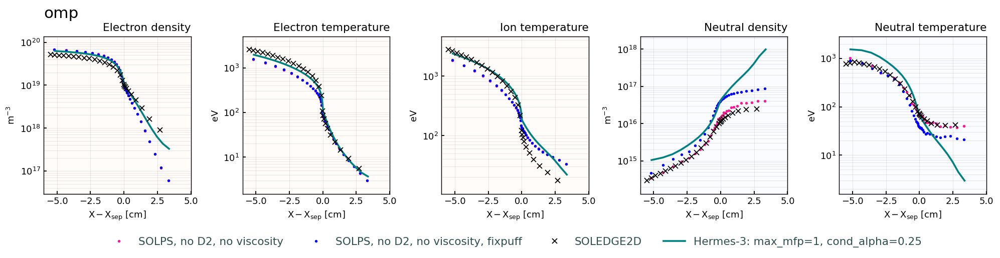

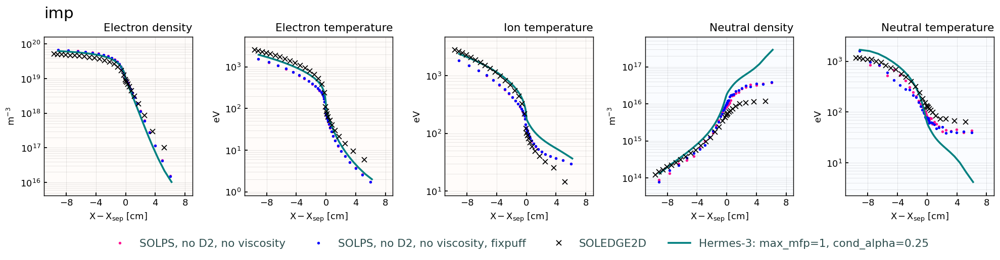

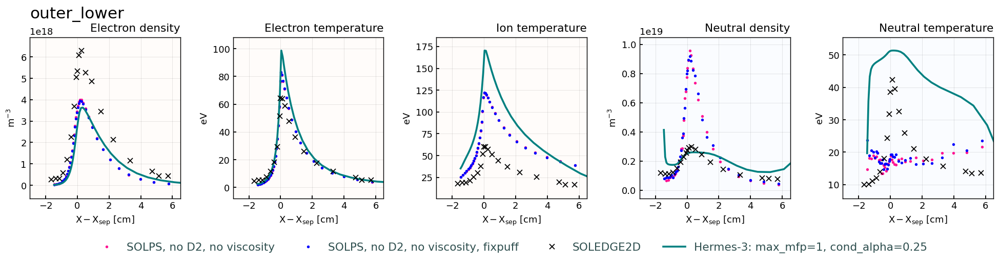

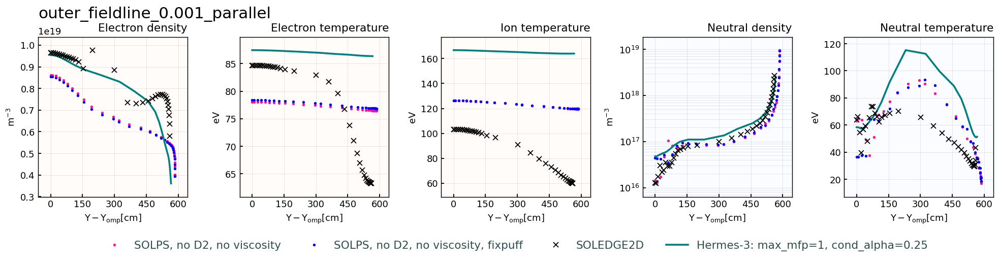

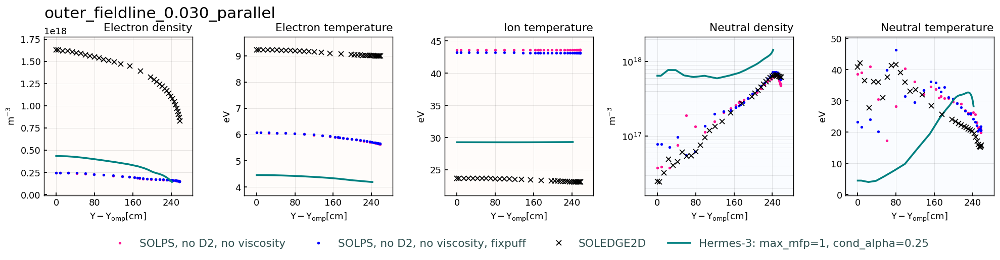

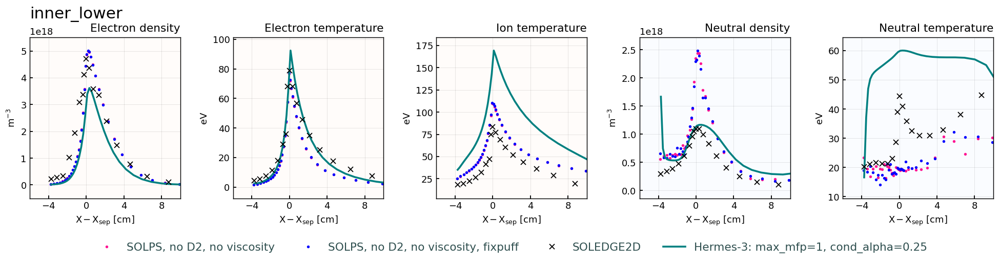

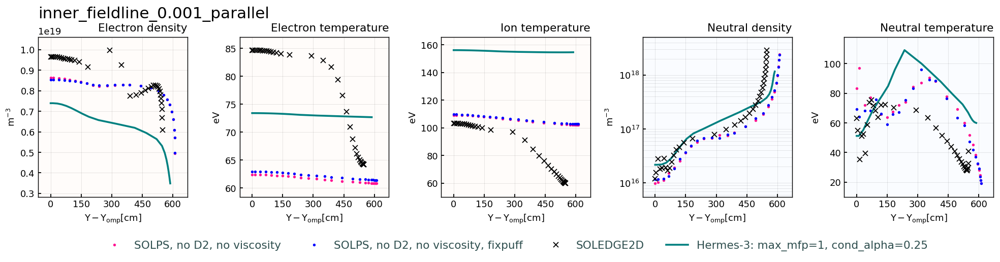

In [ ]:
lineplot_compare(
    cases = { 

    "SOLPS, no D2, no viscosity" : dict(data=sp["tightwall_noD2_1e19_novisc"], color="deeppink"),
    "SOLPS, no D2, no viscosity, fixpuff" : dict(data=sp["tightwall_noD2_1e19_fixpuff"], color="blue"),
    "SOLEDGE2D" : dict(data=sl["tightwall_1e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['1e19'], color = "teal"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 2e19

In [36]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc', 'tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_1e19_fixpuff', 'tightwall_noD2_2e19_fixpuff', 'tightwall_noD2_3e19_fixpuff', 'tightwall_2e19', 'tightwall_3e19', 'tightwall_noD2_1e19', 'tightwall_noD2_2e19', 'tightwall_noD2_3e19'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


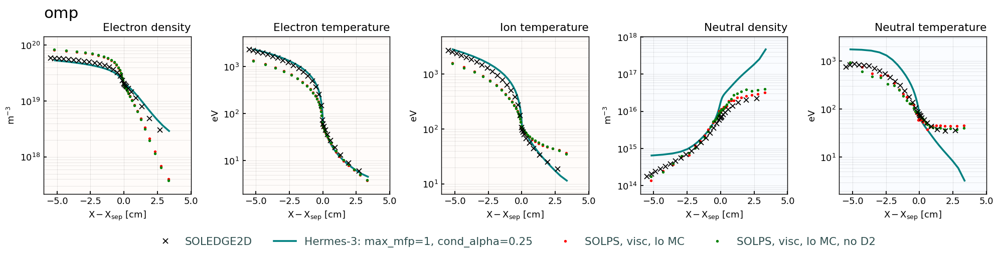

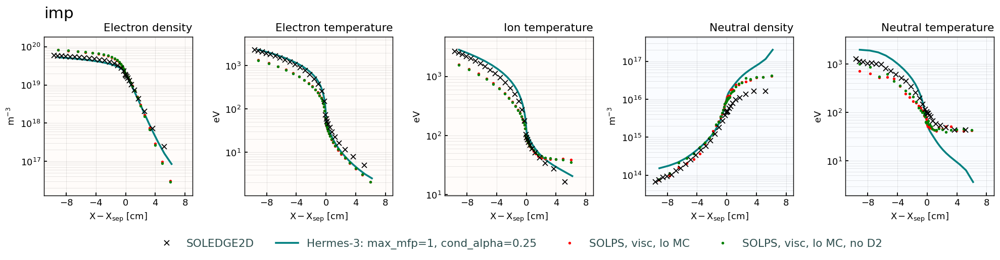

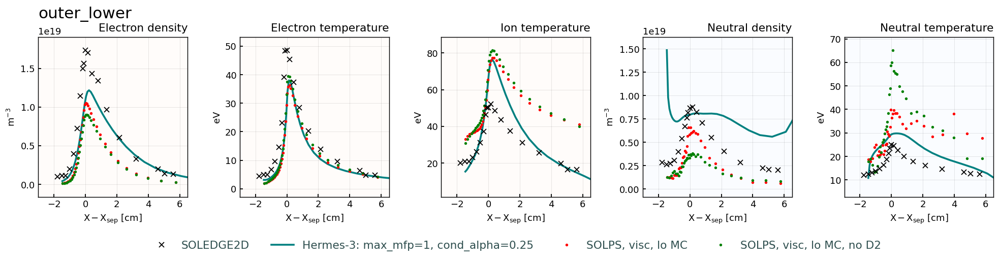

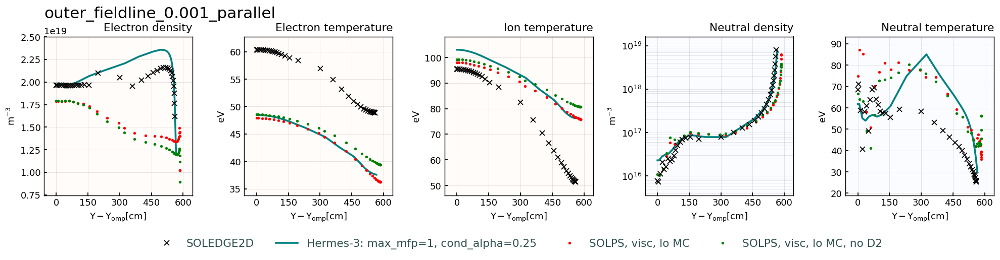

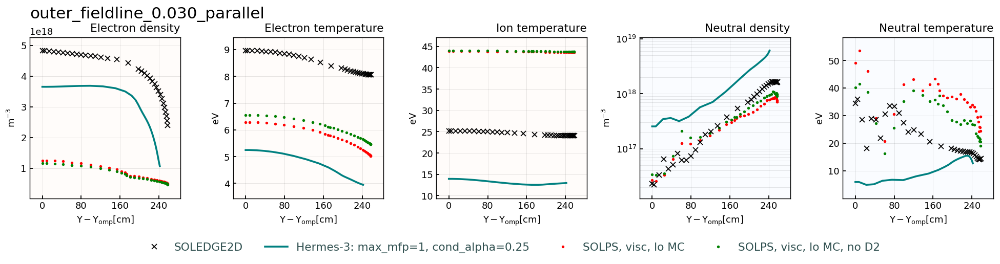

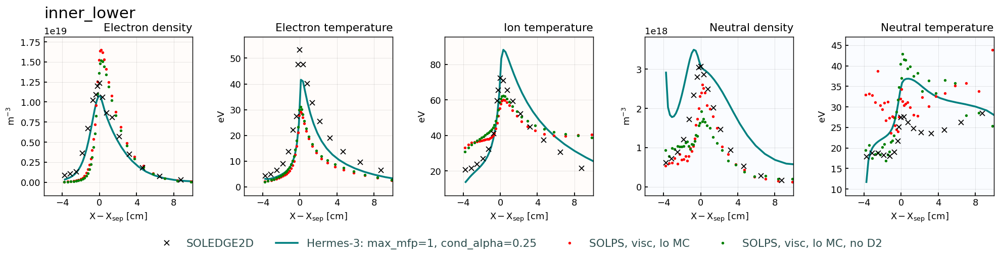

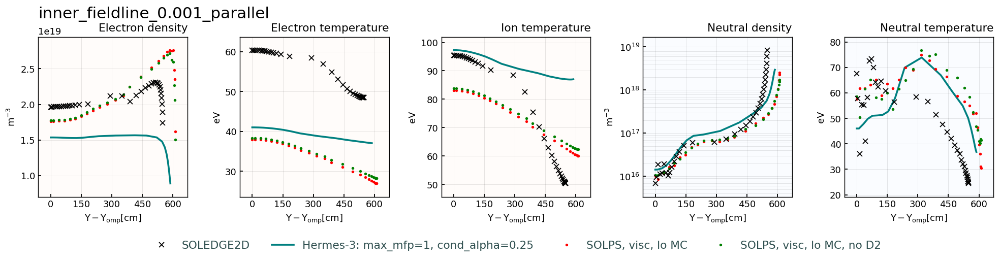

In [41]:
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['2e19'], color = "teal"),
    
    "SOLPS, visc, lo MC" : dict(data=sp["tightwall_2e19"], color="red"),
    "SOLPS, visc, lo MC, no D2" : dict(data=sp["tightwall_noD2_2e19"], color="green"),

    # "SOLPS, no D2, no viscosity, loMC" : dict(data=sp["tightwall_noD2_2e19_novisc"], color="deeppink"),
    # "SOLPS, no D2, no viscosity, fixpuff, loMC" : dict(data=sp["tightwall_noD2_2e19_fixpuff"], color="blue"),



    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

## 3e19

In [ ]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_3e19_fixpuff_spectra'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


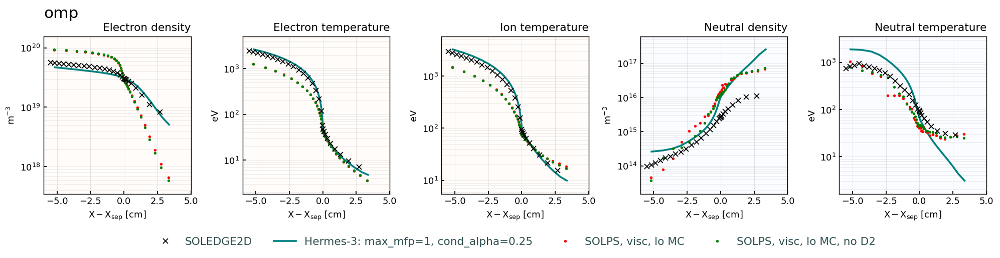

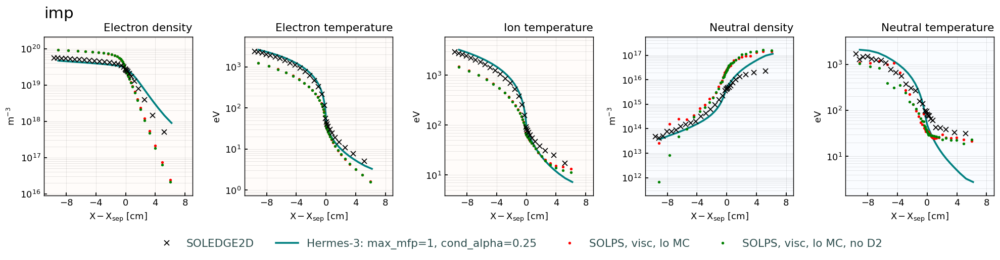

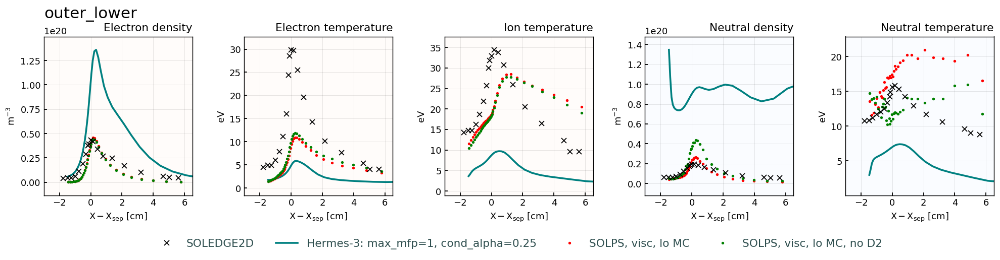

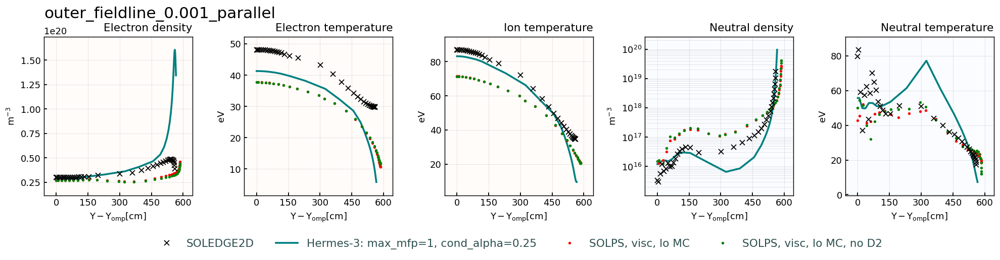

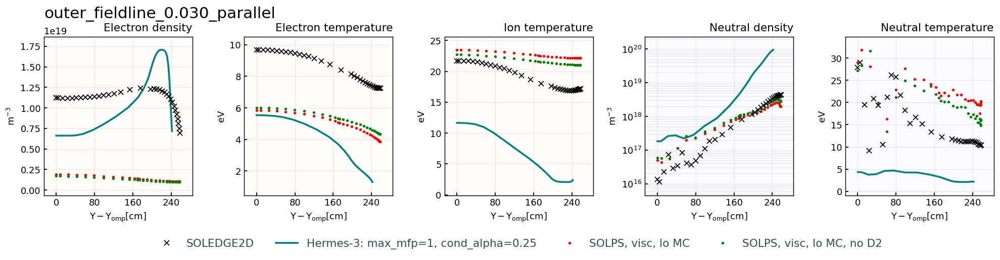

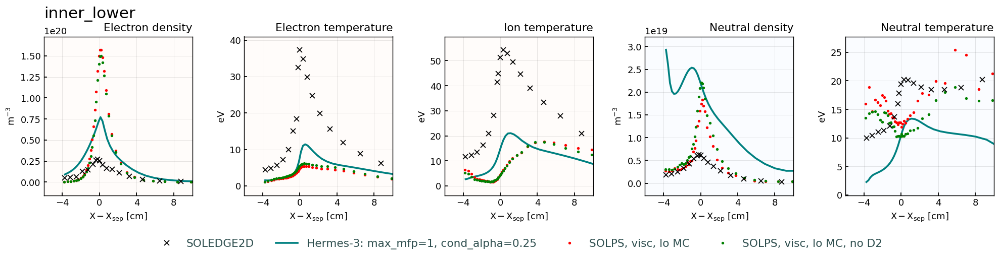

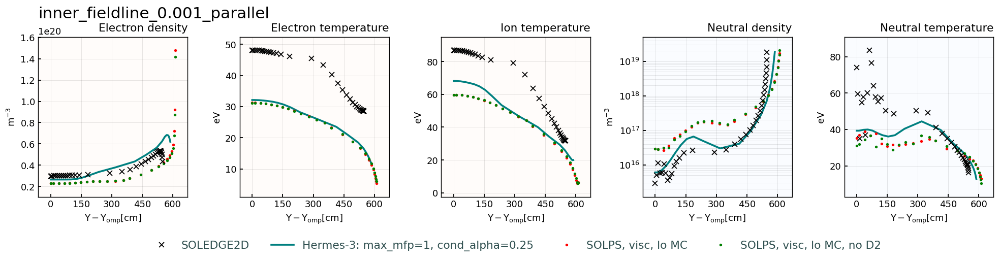

In [42]:
lineplot_compare(
    cases = { 
    "SOLEDGE2D" : dict(data=sl["tightwall_3e19"], color="black"),
    r"Hermes-3: max_mfp=1, cond_alpha=0.25" : dict(data=hr['3e19'], color = "teal"),

    "SOLPS, visc, lo MC" : dict(data=sp["tightwall_3e19"], color="red"),
    "SOLPS, visc, lo MC, no D2" : dict(data=sp["tightwall_noD2_3e19"], color="green"),

    },
    regions = [
        "omp", "imp", "outer_lower", "outer_fieldline_0.001_parallel", 
        "outer_fieldline_0.030_parallel", "inner_lower", "inner_fieldline_0.001_parallel"],  
    # regions = ["outer_fieldline_parallel"],  
    params = ["Ne", "Te", "Td+", "Na",  "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    # params = ["Ne", "Sd+_iz"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    ylims = (5e17, 2e20),
    lw = 2,
    legend_nrows =1,
    combine_molecules = False
)

# Comparing across densities

## Ionisation

In [86]:
spc = sp['tightwall_noD2_1e19_spectrum']
spc

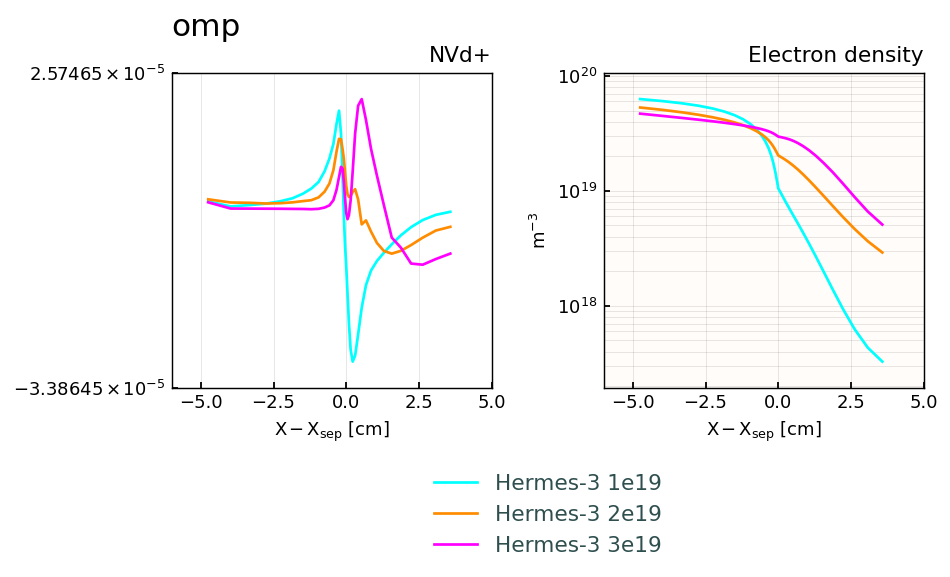

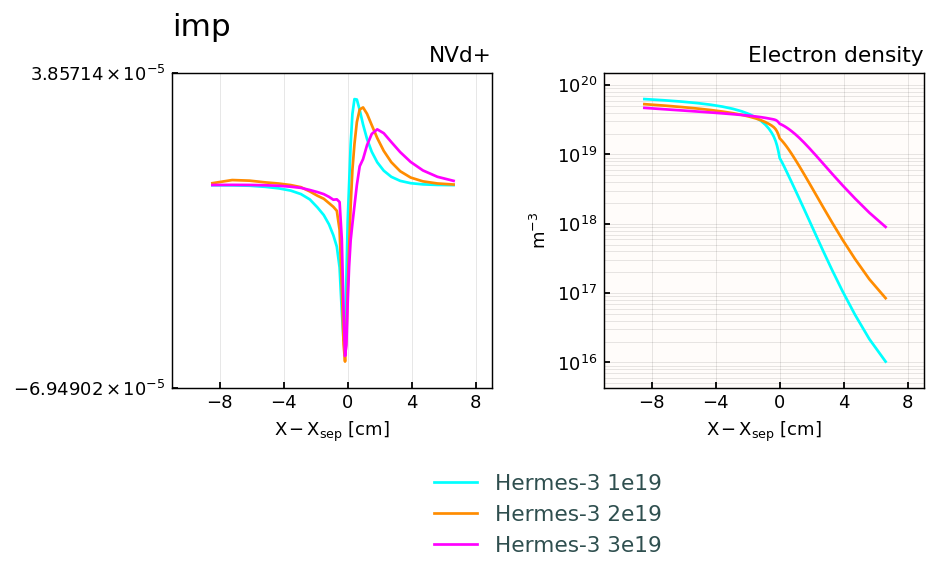

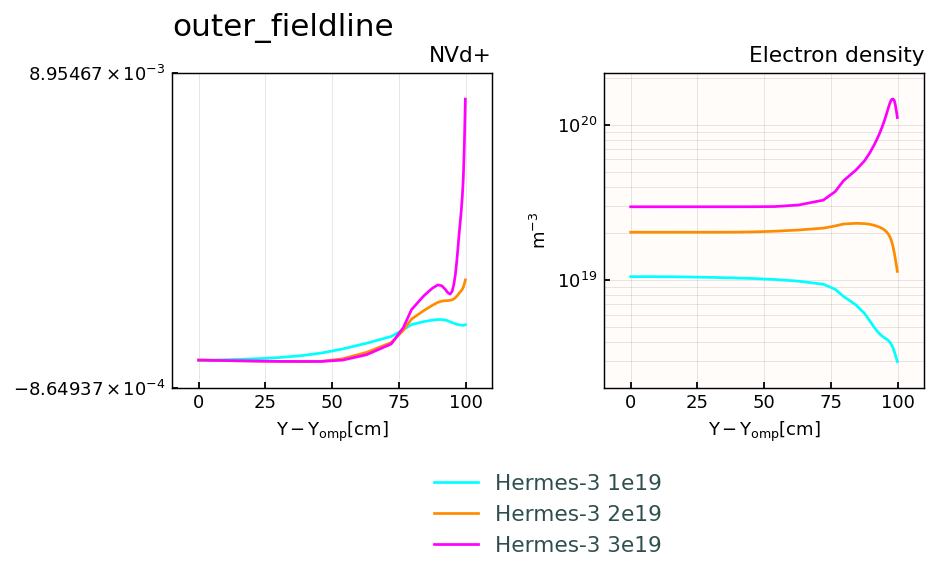

In [136]:
lineplot_compare(
    cases = { 
    r"Hermes-3 1e19" : dict(data=hr['1e19'], color = "cyan"),
    r"Hermes-3 2e19" : dict(data=hr['2e19'], color = "darkorange"),
    r"Hermes-3 3e19" : dict(data=hr['3e19'], color = "magenta"),
    
    # r"SOLPS 1e19" : dict(data=sp['tightwall_noD2_1e19_spectrum'], color = "cyan"),
    # r"SOLPS 2e19" : dict(data=sp['tightwall_noD2_2e19_spectrum'], color = "darkorange"),
    # r"SOLPS 3e19" : dict(data=sp['tightwall_noD2_3e19_spectrum'], color = "magenta"),
    
    # r"SOLEDGE2D 1e19" : dict(data=sl['tightwall_1e19'], color = "cyan"),
    # r"SOLEDGE2D 2e19" : dict(data=sl['tightwall_2e19'], color = "darkorange"),
    # r"SOLEDGE2D 3e19" : dict(data=sl['tightwall_3e19'], color = "magenta"),
    
    },
    regions = ["omp", "imp", "outer_fieldline"],  
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["NVd+", "Ne"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 100,
    # ylims = (0, 2.1e22),
    lw = 1.5,
    legend_nrows =3,
    combine_molecules = False
)

## Radial neutral advection

In [43]:
solpscases.keys()

dict_keys(['tightwall_1e19_spectrum', 'tightwall_2e19_spectrum', 'tightwall_3e19_spectrum', 'tightwall_noD2_1e19_spectrum', 'tightwall_noD2_2e19_spectrum', 'tightwall_noD2_3e19_spectrum', 'tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc', 'tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra'])

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


Text(0.5, 1.0, 'Midplane radial neutral advection')

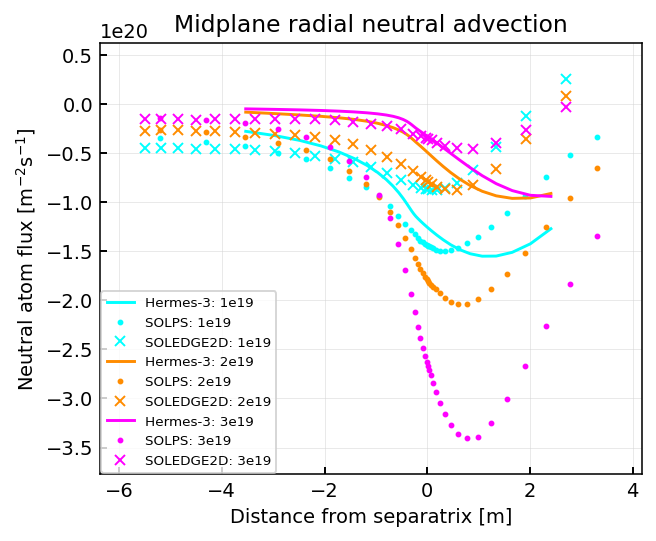

In [44]:
fig, ax = plt.subplots()

colors = ["cyan", "darkorange", "magenta"]

for i, dens in enumerate(["1e19", "2e19", "3e19"]):

    spc = SOLPScase(solpscases[f"tightwall_noD2_{dens}_novisc_spectra"])
    solps = spc.get_1d_radial_data(["rfluxa"], region = "omp")
    kwargs = dict(lw = 1.5)
    ds = cs[dens].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    # ax.plot(dist*100, omp["pf_perp_diff_R_d"] /  (omp["dy"]*omp["dz"]), **kwargs, label = f"Hermes-3: {case}")
    ax.plot(dist*100, omp["ParticleFlow_d_xlow"] /  (omp["dy"]*omp["dz"]) , **kwargs, c = colors[i], label = f"Hermes-3: {dens}")

    # SOLPS
    ax.plot(solps.dist*100, solps["rfluxa"], label = f"SOLPS: {dens}", marker = "o", ms = 2, c = colors[i], lw = 0, alpha = 1)

    # SOLEDGE
    slc = SOLEDGEcase(path = soledgecases[f"tightwall_{dens}"])
    df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
    df["NVxn"] = df["vxni"] * df["Nni"]
    ax.plot(df["dist"]*100, df["NVxn"], lw=0, marker = "x", ms = 5, markeredgewidth=1.0, label = f"SOLEDGE2D: {dens}", c = colors[i])

ax.legend(fontsize = "x-small")

ax.set_xlabel("Distance from separatrix [m]")
ax.set_ylabel("Neutral atom flux [$m^{-2}s^{-1}$]")
ax.set_title("Midplane radial neutral advection")

## Radial neutral velocity

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


Text(0.5, 1.0, 'Midplane radial neutral velocity')

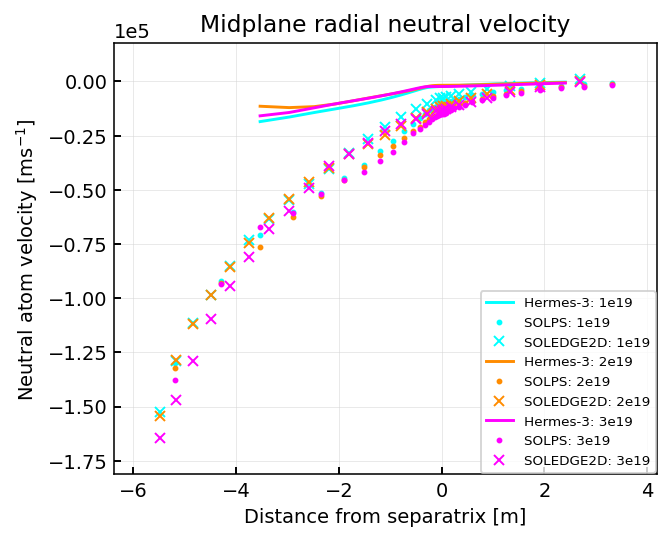

In [45]:
fig, ax = plt.subplots()

colors = ["cyan", "darkorange", "magenta"]

for i, dens in enumerate(["1e19", "2e19", "3e19"]):

    spc = SOLPScase(solpscases[f"tightwall_noD2_{dens}_novisc_spectra"])
    solps = spc.get_1d_radial_data(["rfluxa", "Na"], region = "omp")
    kwargs = dict(lw = 1.5)
    ds = cs[dens].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    # ax.plot(dist*100, omp["pf_perp_diff_R_d"] /  (omp["dy"]*omp["dz"]), **kwargs, label = f"Hermes-3: {case}")
    ax.plot(dist*100, omp["ParticleFlow_d_xlow"] /  (omp["dy"]*omp["dz"]) / omp["Nd"] , **kwargs, c = colors[i], label = f"Hermes-3: {dens}")

    # SOLPS
    ax.plot(solps.dist*100, solps["rfluxa"] / solps["Na"], label = f"SOLPS: {dens}", marker = "o", ms = 2, c = colors[i], lw = 0, alpha = 1)

    # SOLEDGE
    slc = SOLEDGEcase(path = soledgecases[f"tightwall_{dens}"])
    df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
    ax.plot(df["dist"]*100, df["vxni"], lw=0, marker = "x", ms = 5, markeredgewidth=1.0, label = f"SOLEDGE2D: {dens}", c = colors[i])

ax.legend(fontsize = "x-small")

ax.set_xlabel("Distance from separatrix [m]")
ax.set_ylabel("Neutral atom velocity [$ms^{-1}$]")
ax.set_title("Midplane radial neutral velocity")

## Neutral density

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


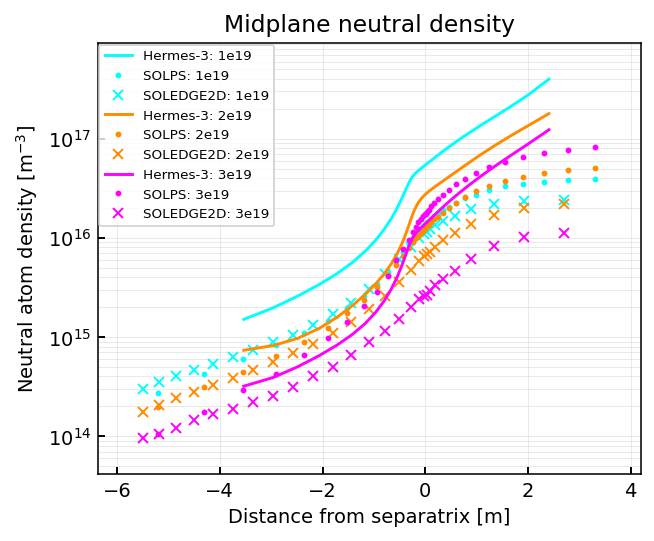

In [46]:
fig, ax = plt.subplots()

colors = ["cyan", "darkorange", "magenta"]

for i, dens in enumerate(["1e19", "2e19", "3e19"]):

    spc = SOLPScase(solpscases[f"tightwall_noD2_{dens}_novisc_spectra"])
    solps = spc.get_1d_radial_data(["rfluxa", "Na"], region = "omp")
    kwargs = dict(lw = 1.5)
    ds = cs[dens].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    # ax.plot(dist*100, omp["pf_perp_diff_R_d"] /  (omp["dy"]*omp["dz"]), **kwargs, label = f"Hermes-3: {case}")
    ax.plot(dist*100, omp["Nd"] , **kwargs, c = colors[i], label = f"Hermes-3: {dens}")

    # SOLPS
    ax.plot(solps.dist*100, solps["Na"], label = f"SOLPS: {dens}", marker = "o", ms = 2, c = colors[i], lw = 0, alpha = 1)

    # SOLEDGE
    slc = SOLEDGEcase(path = soledgecases[f"tightwall_{dens}"])
    df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
    ax.plot(df["dist"]*100, df["Nni"], lw=0, marker = "x", ms = 5, markeredgewidth=1.0, label = f"SOLEDGE2D: {dens}", c = colors[i])

ax.legend(fontsize = "x-small")

ax.set_xlabel("Distance from separatrix [m]")
ax.set_ylabel("Neutral atom density [$m^{-3}$]")
ax.set_title("Midplane neutral density")
ax.set_yscale("log")

## Parallel ion momentum

Text(0.5, 1.0, 'Parallel momentum')

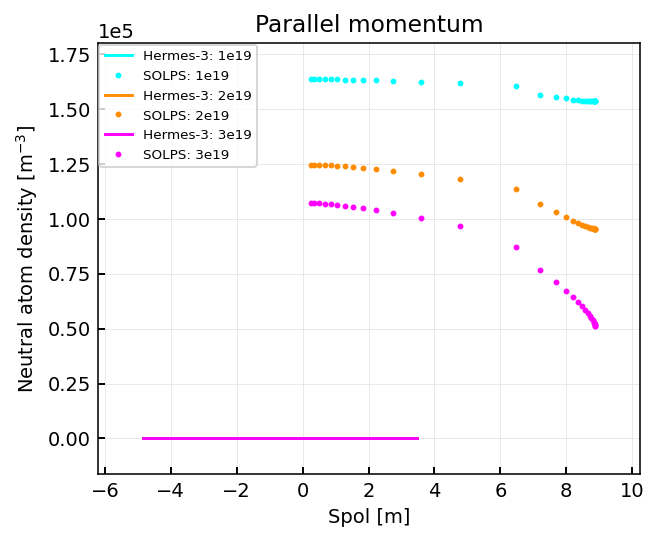

In [21]:
fig, ax = plt.subplots()

colors = ["cyan", "darkorange", "magenta"]

for i, dens in enumerate(["1e19", "2e19", "3e19"]):

    # Hermes-3
    kwargs = dict(lw = 1.5)
    ds = cs[dens].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    ax.plot(dist*100, omp["NVd+"] , **kwargs, c = colors[i], label = f"Hermes-3: {dens}")

    # SOLPS
    spc = SOLPScase(solpscases[f"tightwall_noD2_{dens}_spectrum"])
    solps = spc.get_1d_poloidal_data(["NVd+", "M"], region = "outer_lower")
    ax.plot(solps.Spar, solps["M"], label = f"SOLPS: {dens}", marker = "o", ms = 2, c = colors[i], lw = 0, alpha = 1)

    # # SOLEDGE
    # slc = SOLEDGEcase(path = soledgecases[f"tightwall_{dens}"])
    # df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
    # ax.plot(df["dist"]*100, df["Nni"], lw=0, marker = "x", ms = 5, markeredgewidth=1.0, label = f"SOLEDGE2D: {dens}", c = colors[i])

ax.legend(fontsize = "x-small")

ax.set_xlabel("Spol [m]")
ax.set_ylabel("Neutral atom density [$m^{-3}$]")
ax.set_title("Parallel momentum")
# ax.set_yscale("symlog")

In [45]:
spc = SOLEDGEcase(solpscases["tightwall_noD2_3e19_fixpuff"])

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\mikek\\OneDrive\\Project\\collab\\tech\\compare_data\\playArounD_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_novisc_fixpuff\\xxxxOK.Js=OFF.GAMMAE=4.5.NESEPM=3.0E+19.NO.D2.eirene_ionz=0.b2tqca_phm0=0/ions_list'

In [49]:
solpscases.keys()

dict_keys(['tightwall_noD2_1e19_novisc', 'tightwall_noD2_2e19_novisc', 'tightwall_noD2_3e19_novisc', 'tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra', 'tightwall_noD2_1e19_fixpuff', 'tightwall_noD2_2e19_fixpuff', 'tightwall_noD2_3e19_fixpuff', 'tightwall_2e19', 'tightwall_3e19', 'tightwall_noD2_1e19', 'tightwall_noD2_2e19', 'tightwall_noD2_3e19'])

# Tracking neutral origin

In [6]:
spc = SOLPScase(solpscases[f"tightwall_noD2_3e19_fixpuff"])


- The two norths are the radial edges of the grid - the inner is the first and outer is second (9 and 10)
- Targets: first W is bottom inner, then top inner, then top outer (W) then bottom outer (E)
- Then a load of PFRs
- Then the radial edges

In [ ]:
#  nstrai= 18,
#  crcstra= 'W', 'E', 'W', 'E', 'S', 'S', 'S', 'S', 'N', 'N', 'C', 'C', 'C', 'C', 'C', 'C', 'V', 'T',
#  rcpos= -1, 48, 49,110, -1, -1, -1, -1, 36, 36,  0,  0,  0,  0,  0,  0,  0,  0,
#  rcstart=  0,  0,  0,  0,  0, 36, 50, 92,  0, 50,  0,  0,  0,  0,  0,  0,  0,  0,
#  rcend= 35, 35, 35, 35, 11, 47, 67,109, 47,109,  0,  0,  0,  0,  0,  0,  0,  0,
#  species_start=  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
#  species_end=  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,

In [7]:
papl = spc.bal["eirene_mc_papl_sna_bal"]

papl.shape

(112, 38, 2, 18)

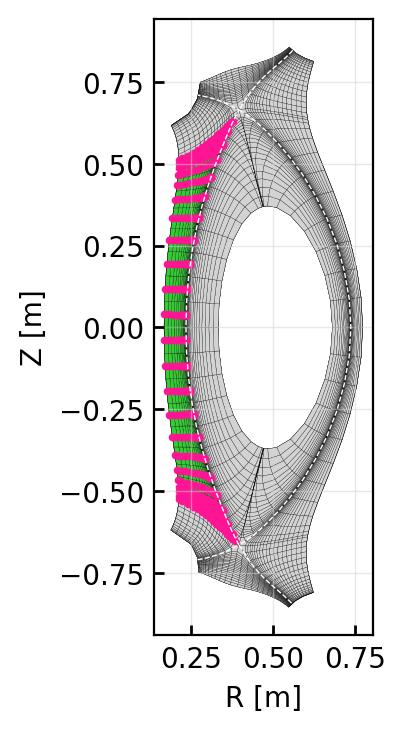

In [105]:
# outer_core = (slice(69,92), slice(None, spc.g["sep"]))
# inner_core = (np.slice(13,36), slice(None, spc.g["sep"]))
outer_sol = (slice(69,92), slice(spc.g["sep"], None))
inner_sol = (slice(13,36), slice(spc.g["sep"], None))
spc.plot_selection(inner_sol, dpi = 200)

## Inner + outer core

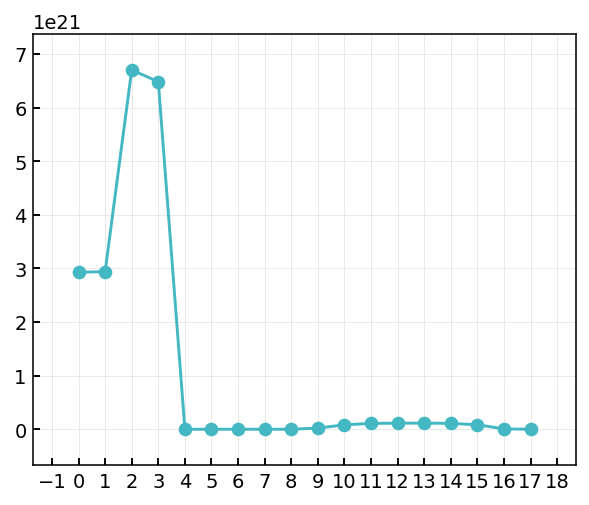

In [ ]:
spc = SOLPScase(solpscases[f"tightwall_noD2_3e19_fixpuff"])

num_strata = papl.shape[3]
# Indices: poloidal, radial, species, strata. Take second species for EIRENE neutrals.
# PAPL is in s^-1 already.

integrals = []
for strata_id in range(num_strata):
    integral_outer = papl[slice(69,92),slice(None, spc.g["sep"]),1,strata_id].sum()
    integral_inner = papl[slice(13,36),slice(None, spc.g["sep"]),1,strata_id].sum()
    integrals.append(integral_outer + integral_inner)
    # print(f"Strata {strata_id}: {integral:.2e}")
    
fig, ax = plt.subplots()
ax.plot(integrals, marker = "o")

ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(1))
a

## Inner SOL
- First two are the inner targets
- Second two are the outer targets

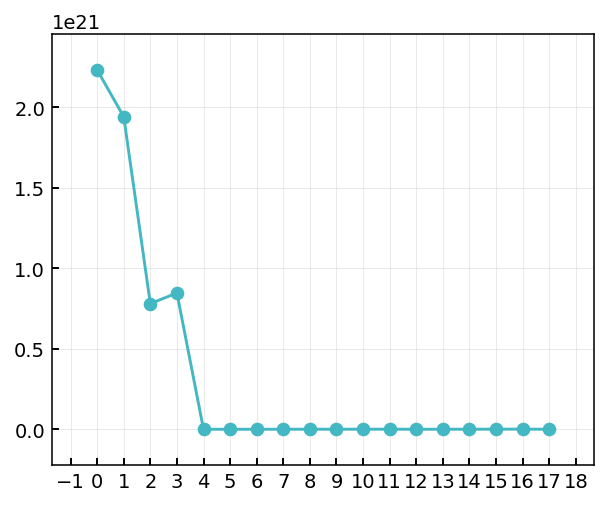

In [108]:
spc = SOLPScase(solpscases[f"tightwall_noD2_3e19_fixpuff"])

num_strata = papl.shape[3]
# Indices: poloidal, radial, species, strata. Take second species for EIRENE neutrals.
# PAPL is in s^-1 already.

integrals = []
for strata_id in range(num_strata):
    integral_inner = papl[inner_sol[0], inner_sol[1],1,strata_id].sum()
    integrals.append(integral_inner)
    # print(f"Strata {strata_id}: {integral:.2e}")
    
fig, ax = plt.subplots()
ax.plot(integrals, marker = "o")

ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(1))

# Pump flux comparison

In [99]:
# SOLPS
## All cases - fix puff, lo MC

#### 1e19
#  SURFACES, AT WHICH TEST PARTICLES FLUXES ARE REDUCED
#    NO. SPECIES  PUMPED FLUX
#      9 D         6.0888E+01
#     10 D         3.5688E+01
#     14 D         3.5752E+01
#     16 D         1.0710E+01
#     28 D         3.5183E+00
#     35 D         5.2040E+01
#     -1 D         9.8187E+00
#     -2 D         3.2790E+01

#  PUMPED FLUX (ATOMIC) PER SPECIES
#  D         2.4120E+02

#  TOTAL PUMPED FLUX (ATOMIC)
#  PUMPTOT=     2.4120E+02

#### 2e19
#  SURFACES, AT WHICH TEST PARTICLES FLUXES ARE REDUCED
#    NO. SPECIES  PUMPED FLUX
#      9 D         6.9547E+01
#     10 D         3.3037E+01
#     14 D         3.3124E+01
#     16 D         1.4395E+01
#     28 D         4.1397E+00
#     35 D         5.9722E+01
#     -1 D         4.0762E+00
#     -2 D         2.0021E+01

#  PUMPED FLUX (ATOMIC) PER SPECIES
#  D         2.3806E+02

#  TOTAL PUMPED FLUX (ATOMIC)
#  PUMPTOT=     2.3806E+02

#### 3e19
#  SURFACES, AT WHICH TEST PARTICLES FLUXES ARE REDUCED
#    NO. SPECIES  PUMPED FLUX
#      9 D         7.4019E+01
#     10 D         3.5748E+01
#     14 D         3.2505E+01
#     16 D         1.5248E+01
#     28 D         4.6423E+00
#     35 D         6.4917E+01
#     -1 D         1.6714E+00
#     -2 D         1.1262E+01

#  PUMPED FLUX (ATOMIC) PER SPECIES
#  D         2.4001E+02

#  TOTAL PUMPED FLUX (ATOMIC)
#  PUMPTOT=     2.4001E+02

pump_solps = {}
pump_solps["1e19"] = 2.4120E+02 / constants("q_e")   # From run.log, total
pump_solps["2e19"] = 2.3806E+02 / constants("q_e")   # From run.log, total
pump_solps["3e19"] = 2.4001E+02 / constants("q_e")   # From run.log, total
[print(x) for x in pump_solps.values()]

1.505452001914745e+21
1.4858536632496858e+21
1.4980246060512353e+21


[None, None, None]

In [95]:
# SOLEDGE
pump_soledge = {}

#### 1e19
# ** PUMP # 1 - iteration averaged - :                                              
#    Pumped flux (recalculated) (H-D-T/s)                             =   5.1150E+20
#    Pumped flux in EIRENE pump, atoms (H-D-T/s)                      =   4.9799E+20
#    Pumped flux in EIRENE pump, molecules (H-D-T/s)                  =   3.8415E+19
#    Pumped flux in EIRENE pump, bulk ions (H+-D+-T+/s)               =   0.0000E+00
#    Pump albedo (recalculated)                                       =   8.0290E-01
#  *********************************************************************************
# ** PUMP # 2 - iteration averaged - :                                              
#    Pumped flux (recalculated) (H-D-T/s)                             =   5.4216E+20
#    Pumped flux in EIRENE pump, atoms (H-D-T/s)                      =   4.8536E+20
#    Pumped flux in EIRENE pump, molecules (H-D-T/s)                  =   8.3793E+19
#    Pumped flux in EIRENE pump, bulk ions (H+-D+-T+/s)               =   0.0000E+00
#    Pump albedo (recalculated)                                       =   8.0249E-01

pump_soledge["1e19"] = 4.9799E+20 + 4.8536E+20 + 3.8415E+19*2 + 8.3793E+19*2

#### 2e19
# ** PUMP # 1 - iteration averaged - :                                              
#    Pumped flux (recalculated) (H-D-T/s)                             =   5.8206E+20
#    Pumped flux in EIRENE pump, atoms (H-D-T/s)                      =   5.8657E+20
#    Pumped flux in EIRENE pump, molecules (H-D-T/s)                  =   2.4419E+19
#    Pumped flux in EIRENE pump, bulk ions (H+-D+-T+/s)               =   0.0000E+00
#    Pump albedo (recalculated)                                       =   8.8269E-01
#  *********************************************************************************
# ** PUMP # 2 - iteration averaged - :                                              
#    Pumped flux (recalculated) (H-D-T/s)                             =   6.3582E+20
#    Pumped flux in EIRENE pump, atoms (H-D-T/s)                      =   5.9324E+20
#    Pumped flux in EIRENE pump, molecules (H-D-T/s)                  =   7.1074E+19
#    Pumped flux in EIRENE pump, bulk ions (H+-D+-T+/s)               =   0.0000E+00
#    Pump albedo (recalculated)                                       =   8.8371E-01

pump_soledge["2e19"] = 5.8657E+20 + 5.9324E+20 + 2.4419E+19*2 + 7.1074E+19*2

#### 3e19
# ** PUMP # 1 - iteration averaged - :                                              
#    Pumped flux (recalculated) (H-D-T/s)                             =   5.2907E+20
#    Pumped flux in EIRENE pump, atoms (H-D-T/s)                      =   6.2227E+20
#    Pumped flux in EIRENE pump, molecules (H-D-T/s)                  =   1.2376E+19
#    Pumped flux in EIRENE pump, bulk ions (H+-D+-T+/s)               =   0.0000E+00
#    Pump albedo (recalculated)                                       =   9.2121E-01
#  *********************************************************************************
# ** PUMP # 2 - iteration averaged - :                                              
#    Pumped flux (recalculated) (H-D-T/s)                             =   6.0557E+20
#    Pumped flux in EIRENE pump, atoms (H-D-T/s)                      =   6.8044E+20
#    Pumped flux in EIRENE pump, molecules (H-D-T/s)                  =   4.2016E+19
#    Pumped flux in EIRENE pump, bulk ions (H+-D+-T+/s)               =   0.0000E+00
#    Pump albedo (recalculated)                                       =   9.2219E-01

pump_soledge["3e19"] = 6.2227E+20 + 6.0557E+20 + 1.2376E+19*2 + 4.2016E+19*2

[print(x) for x in pump_soledge.values()]

1.227766e+21
1.370796e+21
1.336624e+21


[None, None, None]

In [82]:
slc = SOLEDGEcase(soledgecases["tightwall_3e19"])

slc.params

['Dense',
 'Tempe',
 'velocitye',
 'Me',
 'IRade',
 '(Dens*Temp^1.5)e',
 'pi_parallele',
 'Alphame',
 'Alphape',
 'Sne',
 'SGe',
 'SEe',
 'count_Zhdanov_min_ne',
 'count_clean_min_ne',
 'count_clean_min_te',
 'count_coupling_min_te',
 'IRad1e',
 'Zeff',
 'SE1e',
 'TotRad',
 'TotNRad',
 'Densi',
 'Tempi',
 'velocityi',
 'Mi',
 'IRadi',
 '(Dens*Temp^1.5)i',
 'pi_paralleli',
 'Alphami',
 'Alphapi',
 'Sni',
 'SGi',
 'SEi',
 'count_Zhdanov_min_ni',
 'count_clean_min_ni',
 'count_clean_min_ti',
 'count_coupling_min_ti',
 'IRad1i',
 'NRadi',
 'Nni',
 'Tni',
 'Pni',
 'vxni',
 'vyni',
 'vzni',
 'Nmi',
 'Tmi',
 'vxmi',
 'vymi',
 'vzmi',
 'Ntii',
 'Ppi',
 'Epi',
 'TDensi',
 'TDensei',
 'FracDensi',
 'Cimpi',
 'FraceDensi',
 'Zavei',
 'TotRadi']

# Wall heat balance

## SOLEDGE

In [14]:
plt.close("all")

self = SOLEDGEcase(soledgecases["tightwall_2e19"])
slcWfluxes = self.get_wall_flux_summary()
display(slcWfluxes)

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


get_wall_triangle
get_wall_triangles
get_wall_triangles.2: Completed
get_wall_triangle: Completed

 ********** 
 **********
get_wall_triangle
get_wall_triangles
get_wall_triangles.2: Completed
get_wall_triangle: Completed


,outer_wall,inner_wall,targets,pfr
E_Total,0.232057,0.038567,1.265799,0.102674
E_incident_Electron,0.000000,0.000000,0.553930,0.000234
E_incident_Ions,0.000000,0.000000,0.963330,0.001283
E_incident_Atoms,0.210326,0.026182,0.070519,0.081643
E_incident_Molecules,0.000000,0.000000,0.000000,0.000000
E_Radiation,0.021104,0.012336,0.019350,0.019273
E_Radiation_Atoms,0.021104,0.012336,0.019350,0.019273
E_Rad_Recombination,0.000000,0.000000,-0.451635,-0.000603
E_Recombination_in_Wall,0.000627,0.000048,0.110306,0.000843


## Hermes-3

In [15]:
hflows = []
for case in cs:

    df = calculate_neutral_heat_balance(cs[case].ds.isel(t=-1), mode = "reflection")
    df = df.loc[["total"], :]
    df.index = [case]
    
    hflows.append(df)
    
hflows = pd.concat(hflows, axis = 0)

In [43]:
hflows

,outer_wall,inner_wall,targets,pfr
base,0.340728,0.043582,0.114408,0.303970
no_fastrec_tune,0.403786,0.050262,0.137139,0.381936
no_fastrec,0.221385,0.026143,0.071519,0.165928
no_neutrefl,-0.000000,-0.000000,-0.000000,-0.000000
high_maxmfp,0.417425,0.043519,0.135362,0.380780
limit_cond,0.289797,0.036843,0.128166,0.298078


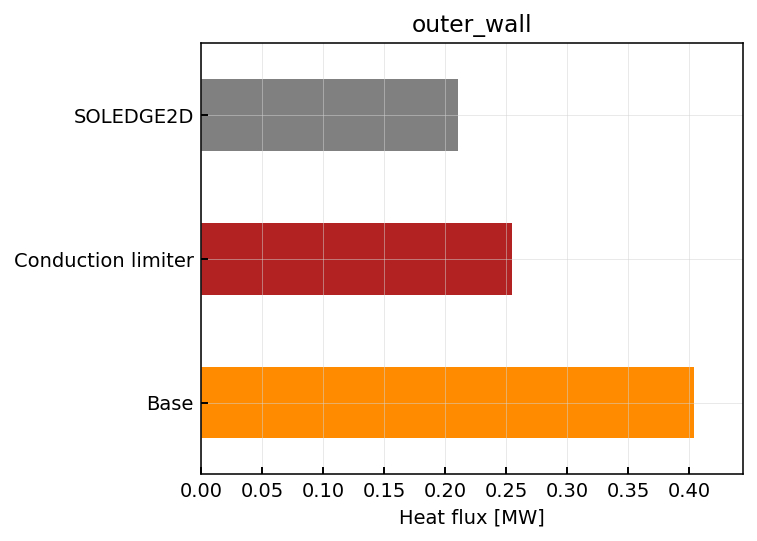

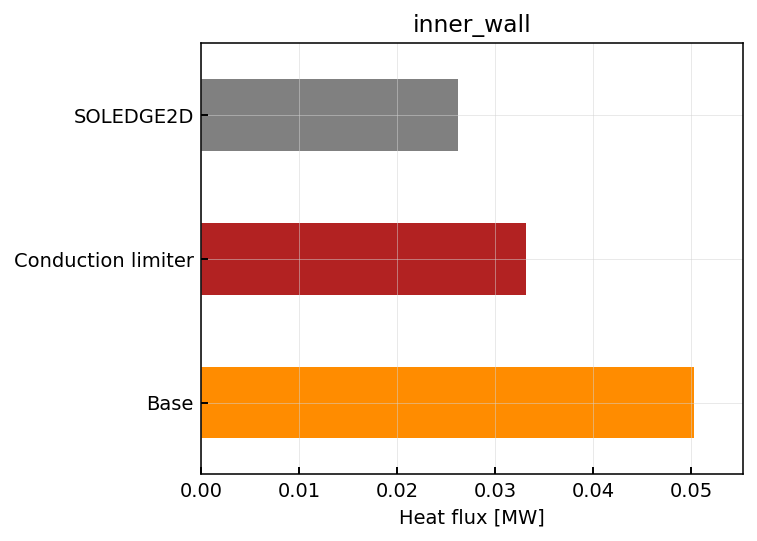

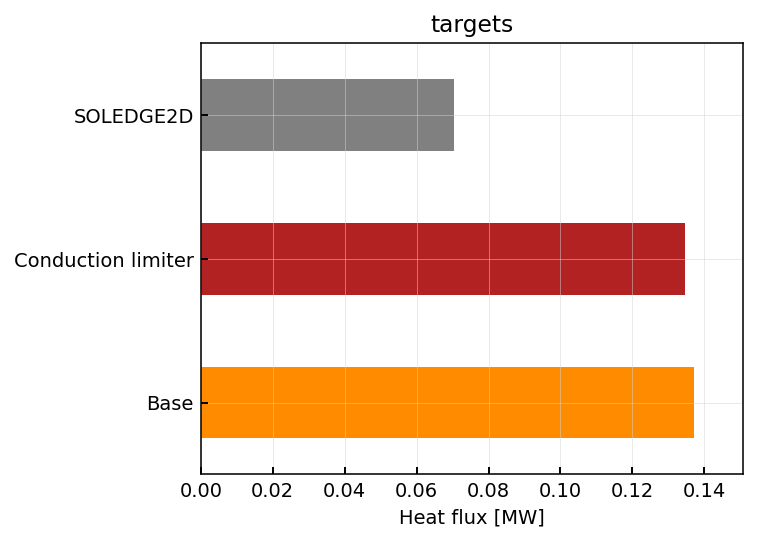

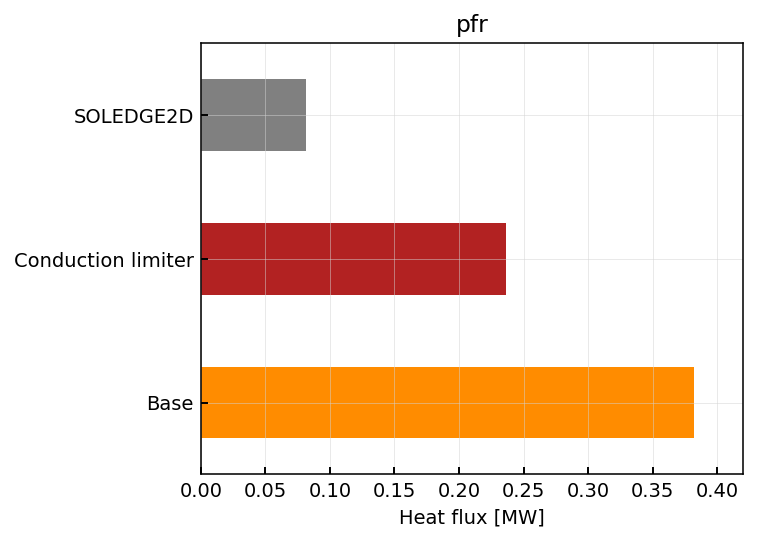

In [17]:
for loc in ["outer_wall", "inner_wall", "targets", "pfr"]:

    fig, ax = plt.subplots()
    dfplot = hflows
    dfplot = hflows.loc[["no_fastrec_tune", "limit_cond_0.25"]]
    dfplot.index = ["Base", "Conduction limiter"]

    # df1 = dfplot.loc[[x for x in dfplot.index if "base" in x], :]
    # df2 = dfplot.loc[[x for x in dfplot.index if "base" not in x], :]
    x = np.arange(len(dfplot)+1)
    width = 0.5
    # for i, case in enumerate(dfplot.index):
        # offset = width * i

    ax.barh(len(dfplot), slcWfluxes.loc["E_incident_Atoms", loc], width, color = "grey")
    # ax.barh(np.arange(len(dfplot)) , dfplot[loc], width, colors = ["darkorange", "firebrick"])
    ax.barh(0 , dfplot.loc["Base", loc], width, color = "darkorange")
    ax.barh(1 , dfplot.loc["Conduction limiter", loc], width, color = "firebrick")
    # ax.barh(np.arange(len(df2)), df2[loc], width)
        # ax.bar_label(rects, padding = 3)
        
    ax.set_yticks(x, list(dfplot.index) + ["SOLEDGE2D"])
    ax.set_xlabel("Heat flux [MW]")
    ax.set_title(loc)

In [83]:
cs.keys()

dict_keys(['base', 'no_fastrec_tune', 'no_fastrec', 'no_neutrefl', 'high_maxmfp', 'limit_cond'])

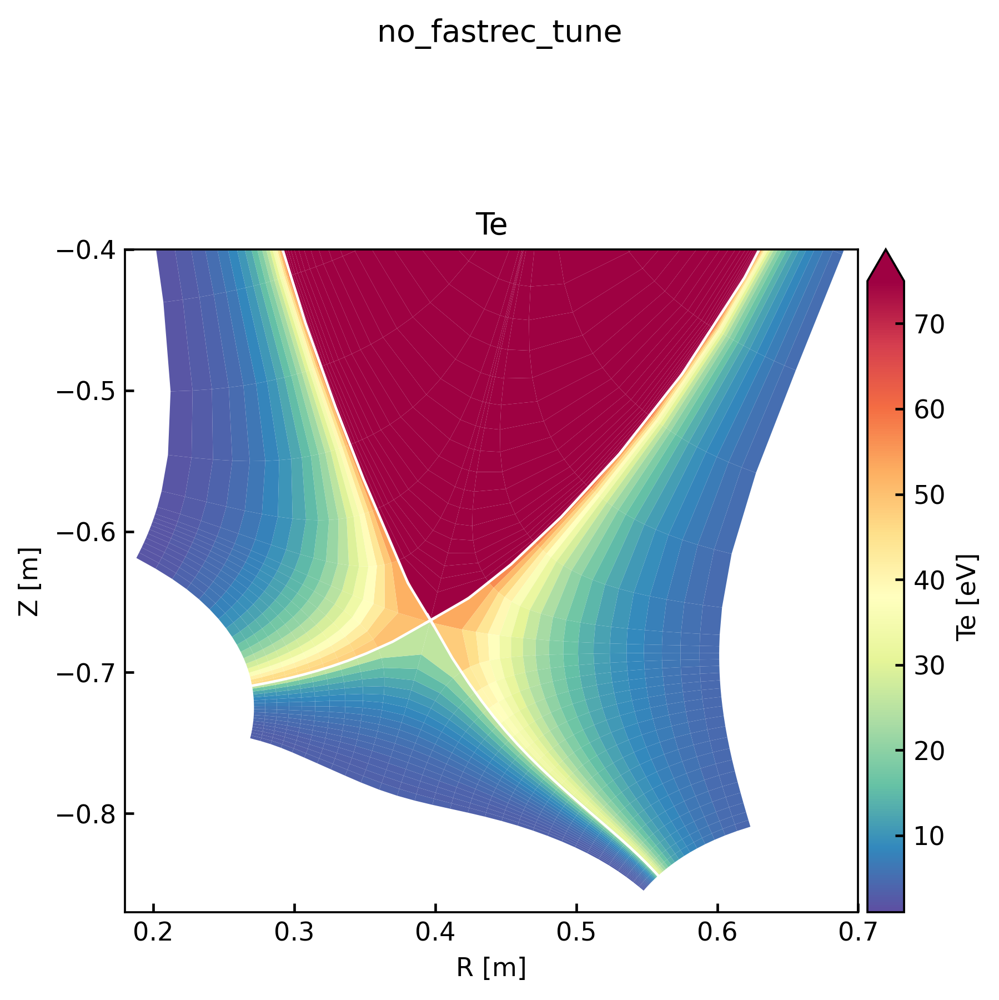

In [95]:


for case in ["no_fastrec_tune"]:
    ds = cs[case].ds.isel(t=-1)
    plot2d(
        [
            # dict(data = ds["Ne"], vmin = 1e18),
            dict(data = ds["Te"], vmin = 1, vmax = 75, logscale = False, extend = "max"),
            # dict(data = ds["Rc"]),
            # dict(data = ds["Rtot"]),
            # dict(data = ds["Nd"]),
            ], 
            xlim = (0.18, 0.7),
            ylim = (-0.87, -0.4),

            title = case,
            # margins = (100, 100),
            dpi = 500,
            scale = 1.5,
            grid = False)

# 3 Code 2D plot

In [6]:
for s in [cs, sp, sl]:
    print(s.keys())

dict_keys(['1e19', '2e19', '3e19'])
dict_keys(['tightwall_noD2_1e19_novisc_spectra', 'tightwall_noD2_2e19_novisc_spectra', 'tightwall_noD2_3e19_novisc_spectra'])
dict_keys(['tightwall_1e19', 'tightwall_2e19', 'widewall_2e19_5m', 'tightwall_3e19', 'widewall_1e19', 'widewall_2e19', 'widewall_3e19'])


In [9]:
%matplotlib widget

SOLEDGE: Combining Nmi and Nni
b2fgmtry loaded from .pkl
read_b2fgmtry -- file version 03.000.007
110 36


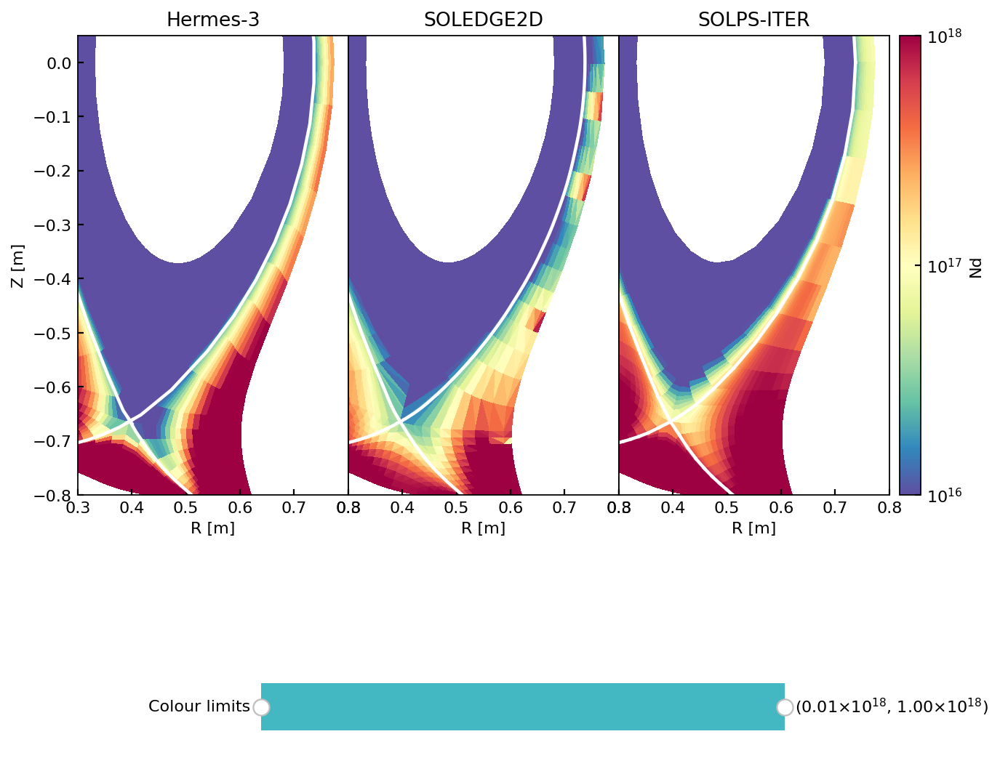

In [80]:
cs["3e19"].ds["Na"] = cs["3e19"].ds["Nd"]

v = viewer_2d(
    "Nd",
    [
        {"name" : "Hermes-3", "code" : "hermes", "ds" : cs["3e19"].ds.isel(t=-1)},
        {"name" : "SOLEDGE2D", "code":"soledge", "path" : soledgecases["tightwall_3e19"]},
        {"name": "SOLPS-ITER", "code":"solps", "path" : solpscases['tightwall_noD2_3e19_novisc_spectra']}
    ],
    logscale = True,
    # vmin = 10,
    # vmax = 1600,
    vmin = 1e16,
    vmax = 1e18,
    dpi = 160,
    # ylim = (-0.87,-0.75),
    ylim = (-0.8, 0.05),
    xlim = (0.3, 0.8),
    wspace = 0.0,
    cmap = "Spectral_r"
    # cmap = "rainbow"
)

In [ ]:
cs["3e19"].ds["Na"] = cs["3e19"].ds["Nd"]

v = viewer_2d(
    "Nd",
    [
        {"name" : "Hermes-3", "code" : "hermes", "ds" : cs["3e19"].ds.isel(t=-1)},
        {"name" : "SOLEDGE2D", "code":"soledge", "path" : soledgecases["tightwall_3e19"]},
        {"name": "SOLPS-ITER", "code":"solps", "path" : solpscases['tightwall_noD2_3e19_novisc_spectra']}
    ],
    logscale = True,
    # vmin = 10,
    # vmax = 1600,
    vmin = 1e16,
    vmax = 1e18,
    dpi = 160,
    # ylim = (-0.87,-0.75),
    ylim = (-0.8, 0.05),
    xlim = (0.3, 0.8),
    wspace = 0.0,
    cmap = "Spectral_r"
    # cmap = "rainbow"
)

In [ ]:
SOLEDGEcase(soledgecases["tightwall_3e19"]).params

1e+16 1e+18


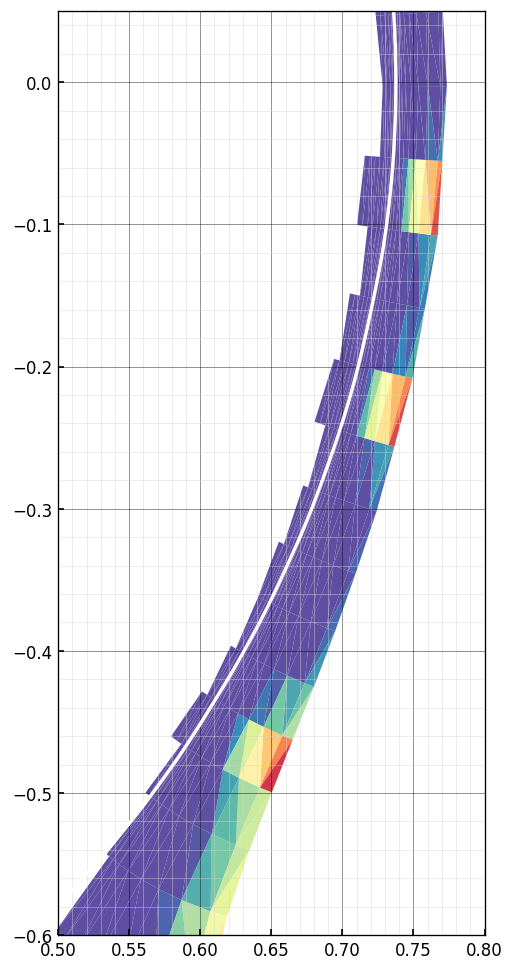

In [ ]:
fig, ax = plt.subplots(dpi = 120, figsize = (20, 10))

SOLEDGEcase(soledgecases["tightwall_3e19"]).plot_2d(
    param = "Nmi", 
    logscale = True,
    fig = fig, 
    ax = ax,
    vmin = 1e16,
    vmax = 1e18,
)

ax.set_ylim(-0.6, 0.05)
ax.set_xlim(0.5, 0.8)
# ax.xaxis.set_major_locator(mpl.ticker.AutoMinorLocator(5))
# ax.yaxis.set_major_locator(mpl.ticker.AutoMinorLocator(5))
ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator(5))
ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator(5))

ax.grid(color = "black")

# SOLPS comparison - parallel

# Radial neutral transport

In [15]:
for case in cs:
    cs[case].ds = calculate_radial_fluxes(cs[case].ds)

In [39]:
cs.keys()

dict_keys(['base', 'no_fastrec_tune', 'no_fastrec', 'no_neutrefl', 'high_maxmfp', 'limit_cond'])

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


Text(0.5, 1.0, 'Midplane radial neutral advection')

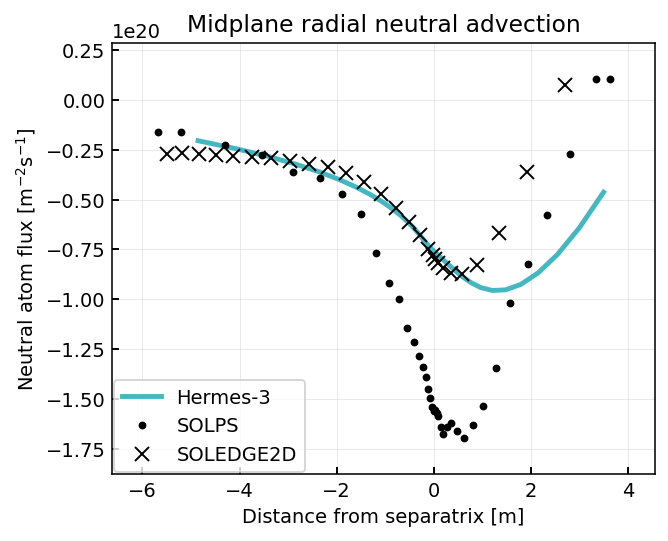

In [105]:
spc = SOLPScase(solpscases["tightwall_2e19"])
solps = spc.get_1d_radial_data(["rfluxa"], region = "omp")

fig, ax = plt.subplots()
kwargs = dict(lw = 2.5)


ds = cs["no_fastrec_tune"].ds
if "t" in ds.dims: ds = ds.isel(t=-1)
omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
R = omp["dr"].cumsum()
dist = (R - R[ds.metadata["ixseps1"]])
# ax.plot(dist*100, omp["pf_perp_diff_R_d"] /  (omp["dy"]*omp["dz"]), **kwargs, label = f"Hermes-3: {case}")
ax.plot(dist*100, omp["ParticleFlow_d_xlow"] /  (omp["dy"]*omp["dz"]) , **kwargs, label = f"Hermes-3")

# SOLPS
ax.plot(solps.dist*100, solps["rfluxa"], label = "SOLPS", marker = "o", ms = 3, c = "k", lw = 0, alpha = 1)

# SOLEDGE
slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
df["NVxn"] = df["vxni"] * df["Nni"]
ax.plot(df["dist"]*100, df["NVxn"], lw=0, marker = "x", ms = 7, markeredgewidth=1.0, label = "SOLEDGE2D", c = "black")

ax.legend()

ax.set_xlabel("Distance from separatrix [m]")
ax.set_ylabel("Neutral atom flux [$m^{-2}s^{-1}$]")
ax.set_title("Midplane radial neutral advection")

In [ ]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)
cases = ["frec_tune", "afnE_mfp1"]
labels = ["Hermes-3: Old model", "Hermes-3: Improved model"]
colors =None
# labels = ["flim=1", "flim=0.9", "flim=0.7"]

# colors = ["teal", "darkorange", "limegreen", "deeppink"]

for i, case in enumerate(cases):
    
    ds = casestore[case].ds.isel(t=-1)
    d = ds.isel(x=slice(2,-2)).sum("theta")
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])
    
    label = case if labels is None else labels[i]
    
    kwargs = {} if colors is None else dict(color = colors[i])
    ax.plot(dist*100, omp["pf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), label = label, lw = 2.5, **kwargs)

# SOLEDGE
slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
df["NVxn"] = df["vxni"] * df["Nni"]
ax.plot(df["dist"]*100, df["NVxn"], lw=0, marker = "x", ms = 7, markeredgewidth=1.0, label = "SOLEDGE2D", c = "black")

df["mfrac"] = df["Nmi"] / (df["Nni"] + df["Nmi"])

ax2 = ax.twinx()
ax2.plot(df["dist"]*100, df["mfrac"], lw = 1, c = "deeppink", ls = "--", label = "Molecule fraction")
ax2.set_ylabel("Molecule fraction: $N_{m}/(N_{a}+N_{m})$", color = "deeppink")
ax2.yaxis.label.set_color("deeppink")
ax2.tick_params(axis="y", colors = "deeppink")

ax.set_ylabel("Neutral radial particle flux $[m^{-2}s^{-1}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")
fig.legend(loc = "upper center",  bbox_to_anchor = (0.35,0.88), fontsize="small", frameon=True, framealpha = 1)
ax.set_xlim(-0.07*100, 0.05*100)
ax.set_ylim(-1.0e20, 0.25e20)

casestore.keys()
ax.grid(color = "k", alpha = 0.6)
ax.set_title("Particle transport at OMP")

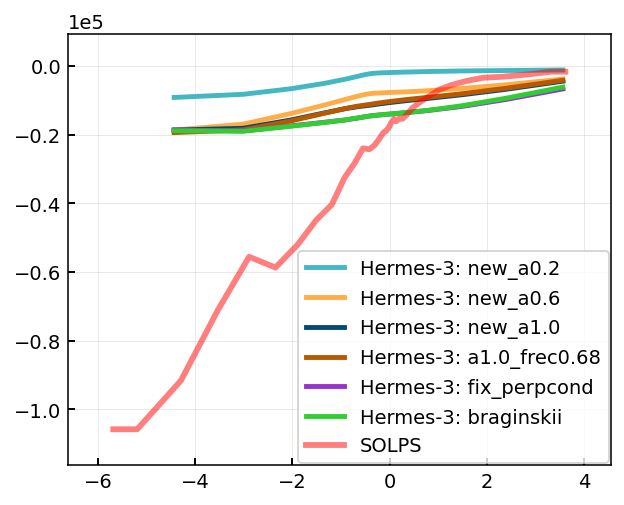

In [33]:
spc = SOLPScase(solpscases["tightwall_noD2_2e19"])
solps = spc.get_1d_radial_data(["rfluxa", "dab2"], region = "omp")

fig, ax = plt.subplots()
kwargs = dict(lw = 2.5)

for case in cs:
# for case in ["fix_eqns", "new_a0.2", "new_a0.6", "new_a1.0"]:
    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    ax.plot(dist*100, omp["ParticleFlow_d_xlow"] /  (omp["dy"]*omp["dz"]) / omp["Nd"], **kwargs, label = f"Hermes-3: {case}")

ax.plot(solps.dist*100, solps["rfluxa"] /  solps["dab2"], label = "SOLPS", c = "r", lw = 3, alpha = 0.5)
ax.legend()


KeyError: 'ConductionFlow_d_xlow'

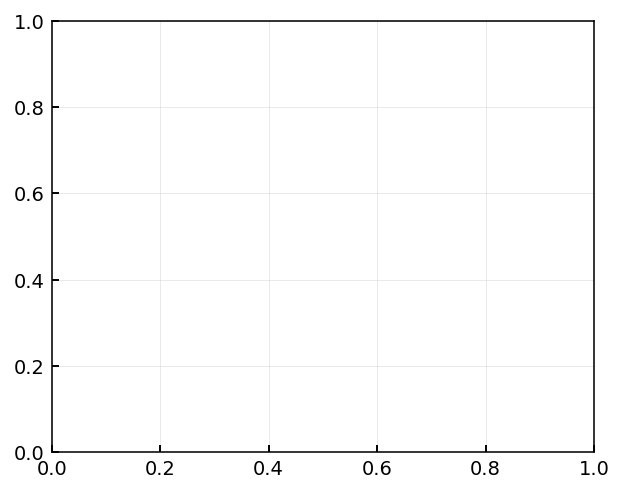

In [28]:
spc = SOLPScase(solpscases["tightwall_noD2_2e19"])
solps = spc.get_1d_radial_data(["rfluxa", "refluxa"], region = "omp")

fig, ax = plt.subplots()
kwargs = dict(lw = 2.5)

for case in cs:
# for case in ["fix_eqns", "new_a0.2", "new_a0.6", "new_a1.0"]:
    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    ax.plot(dist*100, omp["EnergyFlow_d_xlow"] /  (omp["dy"]*omp["dz"]) + omp["ConductionFlow_d_xlow"] /  (omp["dy"]*omp["dz"]), **kwargs, label = f"Hermes-3: {case}")

ax.plot(solps.dist*100, solps["refluxa"], label = "SOLPS", c = "r", lw = 3, alpha = 0.5)
ax.legend()
ax.set_ylim(-0.3e5, 0)
# ax.set_yscale("symlog")


In [44]:
cs.keys()

dict_keys(['base', 'fix_eqns', 'base_AFN'])

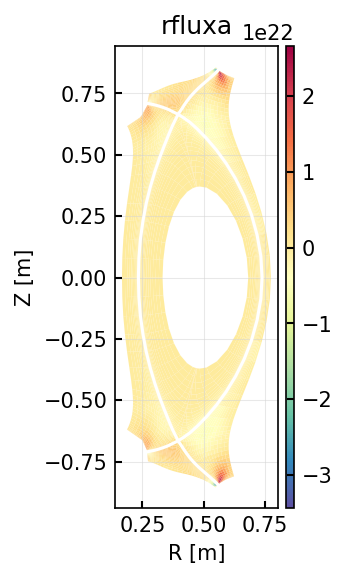

In [52]:
spc.plot_2d("rfluxa", cbar = True, logscale = False, antialias = True)

AttributeError: 'DataArray' object has no attribute 'set_xindex'

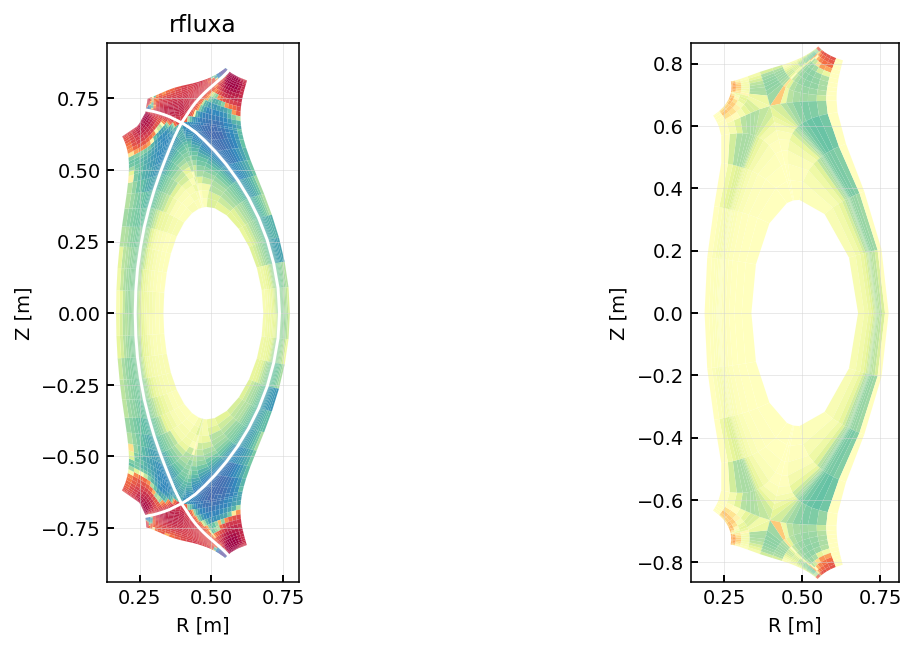

In [13]:
fig, axes = plt.subplots(1,2, figsize = (10,5))
from hermes3.utils import create_norm
norm = create_norm(True, None, -1e22, 1e22, linthresh = 1e20)

## SOLPS
spc = SOLPScase(solpscases["tightwall_noD2_2e19"])
spc.plot_2d("rfluxa", norm = norm,  cbar = False, logscale = False, ax = axes[0], antialias = True)


## SOLEDGE
# slc = SOLEDGEcase(soledgecases["tightwall_2e19"])
# Ti = slc._get_2d_on_tri("Tempi")
# Te = slc._get_2d_on_tri("Tempe")
# ratio = Ti/Te


# slc.plot_2d(fig = fig, ax = axes[1], data = ratio, norm = norm, logscale = False, linewidth = 0)


## Hermes-3
ds = cs["new_a0.6"].ds.isel(t=-1)
(ds["pf_perp_diff_R_d"] /  (ds["dy"]*ds["dz"])).hermesm.clean_guards().bout.polygon(ax = axes[1], cmap = "Spectral_r", logscale = False, add_colorbar = False, norm = norm, antialias = True,
separatrix_kwargs = dict(color = "white", linestyle = "solid"), targets = False)


for ax in axes.flatten():
    # ax.set_ylim(-0.85, 0.05)
    
    # ax.set_xlim(0.2, 0.65)
    ax.set_ylim(-0.85, 0.1)
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
    
    
divider = make_axes_locatable(axes[1])
cax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(mpl.cm.ScalarMappable(norm = norm, cmap = "Spectral_r"), cax = cax, label = "Ti/Te", extend = "both")
    
axes[0].set_title("SOLPS-ITER")
# axes[1].set_title("SOLEDGE2D")
axes[1].set_title("Hermes-3")
fig.subplots_adjust(wspace = 0.25)